<h1> Malaria Forecasting</h1>

In [2]:
from __future__ import division
import numpy as np
import json
import re
import gzip
import pandas as pd
%pylab inline
pylab.rcParams['figure.figsize'] = (12.0, 8.0) # set size of figures"
plt.rcParams.update({'font.size': 24})
import seaborn as sns
import datetime

# for NVD3 plots
#from IPython.html.widgets import *
#from nvd3 import pieChart
#import nvd3
#nvd3.ipynb.initialize_javascript(use_remote=True)

from ethiopian_date import ethiopian_date

pd.set_option('display.max_rows', 50)

Populating the interactive namespace from numpy and matplotlib


In [3]:
DF_ind = pd.read_csv('Malaria_regional_3-15-2017.csv')
# Convert string to datetime
DF_ind['Real_Date'] = pd.to_datetime(DF_ind['Real_Date'])
DF_ind['E_Date'] = pd.to_datetime(DF_ind['E_Date'])
# list of indicator names
ind_names = DF_ind.groupby('Indicator').count().index
ind_names

Index([u'Number of HHs that need LLINs in the last 12 months',
       u'Number of slides or RDT positive for malaria',
       u'Number of slides or RDT positive for malaria 5-14 years: Females',
       u'Number of slides or RDT positive for malaria 5-14 years: Males',
       u'Number of slides or RDT positive for malaria < 5 years: Females',
       u'Number of slides or RDT positive for malaria < 5 years: Males',
       u'Number of slides or RDT positive for malaria >=15 years: Females',
       u'Number of slides or RDT positive for malaria >=15 years: Males',
       u'Number of targeted HHs received at least one LLINs in the last 12 months',
       u'Population',
       u'Proportion of targeted HH covered with LLIN in the last 12 months',
       u'Total number of slides or RDT performed for malaria diagnosis'],
      dtype='object', name=u'Indicator')

<h1> Plotting code </h1>

In [4]:
def pd_proper_dateformat(series):
    '''Given a pandas time series return x, y with the time formatted to plot in matplotlib'''
    return series.index.astype(datetime.datetime), series.values

def frac_err(num, sig_num, den, sig_den):
    return sqrt( (sig_num / den) ** 2 + ((sig_den * num) / (den**2)) ** 2)

def plot_date_indicator(dataframe, indicator, date_type='E_Date', ind2=None, val_name='val'):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby(['Region', date_type])[val_name].sum()
    ylab_text = indicator    
    #If not none use indicator 2 as the denominator
    if ind2:
        to_plot /= dataframe.loc[dataframe['Indicator'] == ind2].reset_index().groupby(['Region', date_type])[val_name].sum()
        ylab_text = '%s per \n %s' % (indicator, ind2)
        
    start,stop=0,1
    number_of_colors= len(to_plot.index.levels[0])
    cm_subsection = linspace(start, stop, number_of_colors) 
    colors = [ cm.jet(x) for x in cm_subsection ]

    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})

    for level,color in zip(to_plot.index.levels[0],colors):
        x, y = pd_proper_dateformat(to_plot[level])
        plt.plot_date(x, y, '.-', color=color, markersize=20, label=level,)
    ylabel('malaria \n'.join(ylab_text.split('malaria')))
    xlabel('Date')
    legend(loc='upper right', numpoints=1,fontsize=12)
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%b'))
    #yscale('log')
    
    return to_plot

def plot_testing(dataframe, indicator, date_type='E_Date', val_name='val', pred_name = 'prediction', train_year = 2007, horz_line = (2007,1), logscale = False, show_leg = True, ylab=None ):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby(['Region', date_type])[val_name].sum()
    ylab_text = indicator
    
    predict_plot = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_year'] > train_year)].reset_index().groupby(['Region', date_type])[pred_name].sum()
    pred_lab_text = pred_name
    #If not none use indicator 2 as the denominator
        
    start,stop=0,1
    number_of_colors= len(to_plot.index.levels[0])
    cm_subsection = linspace(start, stop, number_of_colors) 
    colors = [ cm.jet(x) for x in cm_subsection ]

    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})

    RMSE = []
    for level,color in zip(to_plot.index.levels[0],colors):
        x, y = pd_proper_dateformat(to_plot[level])
        xp, yp = pd_proper_dateformat(predict_plot[level])
        plt.plot_date(x, y, '.-', color=color, markersize=20, label=level,)
        plt.plot_date(xp, yp, '--', color=color, markersize=20, alpha = 0.9)
        
        RMSE.append( (level, sqrt( mean((predict_plot[level] - to_plot[level])**2) ) / mean(to_plot[level]) ) ) 
    
    if ylab:
        ylabel(ylab)
    else:
        ylabel(' malaria\n'.join(ylab_text.split('malaria')))
        
    #xlabel('Date')
    if show_leg:
        legend(loc='upper right', numpoints=1,fontsize=12)
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    
    plt.plot_date(['%s-%s-01' % (horz_line), '%s-%s-01' % (horz_line)],[to_plot.min()*0.8, to_plot.max()*1.2],'-', color = 'k')
    
    if logscale:
        plt.yscale('log')
        
    return RMSE

def plot_forcasting(dataframe, df_predict, indicator, val_name='val', train_year = 2007, horz_line = (2007,1) , logscale = False, show_leg = True, ylab=None):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby(['Region', 'E_Date'])[val_name].sum()
    ylab_text = indicator
    
    predict_plot = df_predict.loc[(df_predict['Indicator'] == indicator) & (df_predict['E_year'] > train_year)].reset_index().groupby(['Region', 'E_Date'])['val'].sum()
    pred_lab_text = 'prediction'
    #If not none use indicator 2 as the denominator
        
    start,stop=0,1
    number_of_colors= len(to_plot.index.levels[0])
    cm_subsection = linspace(start, stop, number_of_colors) 
    colors = [ cm.jet(x) for x in cm_subsection ]

    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})

    RMSE = []
    for level,color in zip(to_plot.index.levels[0],colors):
        x, y = pd_proper_dateformat(to_plot[level])
        xp, yp = pd_proper_dateformat(predict_plot[level])
        plt.plot_date(x, y, '.-', color=color, markersize=20, label=level,)
        plt.plot_date(xp, yp, '--', color=color, markersize=20, alpha = 0.9)
        
        RMSE.append( (level, sqrt( mean((predict_plot[level] - to_plot[level])**2) ) / mean(to_plot[level]) ) ) 
        
    if ylab:
        ylabel(' malaria\n'.join(ylab.split('malaria')))
    else:
        ylabel(' malaria\n'.join(ylab_text.split('malaria')))
        
    #xlabel('Date')
    if show_leg:
        legend(loc='upper right', numpoints=1,fontsize=12)
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    
    plt.plot_date(['%s-%s-01' % horz_line, '%s-%s-01' % horz_line],[to_plot.min()*0.8, to_plot.max()*1.2],'-', color = 'k')
    
    if logscale:
        plt.yscale('log')
        
    return RMSE

def plot_testing_nation(dataframe, indicator, date_type='E_Date', val_name='val', pred_name = 'prediction', \
                        train_year = 2007, horz_line = (2007,1), ylab=None, cf_band=False):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby([date_type])[val_name].sum()
    ylab_text = indicator
    
    predict_plot = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_year'] > train_year)].reset_index().groupby([date_type])[pred_name].sum()
    pred_lab_text = pred_name
    #If not none use indicator 2 as the denominator

    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=1.6, rc={"lines.linewidth": 2.5})

    plt.subplot2grid((4,1), (0,0), rowspan=3)
    x, y = pd_proper_dateformat(to_plot)
    xp, yp = pd_proper_dateformat(predict_plot)
    plt.plot_date(x, y, '.-', color='k', markersize=20, label='National Average',)
    plt.plot_date(xp, yp, '--', color='k', markersize=20, label='Prediction', alpha = 0.7)
        
    if ylab:
        ylabel(ylab)
    else:
        ylabel(ylab_text)
        
    #xlabel('Date')
    legend(loc='upper right', numpoints=1, fontsize=12)
    ax = gca()
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    
    plt.plot_date(['%s-%s-01' % horz_line, '%s-%s-01' % horz_line],[to_plot.min()*0.8, to_plot.max()*1.2],'-', color = 'k')
    
    
    # if confidence bands:
    if cf_band:
        predict_upper = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_year'] > train_year)].reset_index().groupby([date_type])['prediction_upper'].sum()
        predict_lower = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_year'] > train_year)].reset_index().groupby([date_type])['prediction_lower'].sum()
        xp_upper, yp_upper = pd_proper_dateformat(predict_upper)
        xp_lower, yp_lower = pd_proper_dateformat(predict_lower)
        plt.fill_between(xp_upper, yp_lower, yp_upper, alpha = 0.3)
    
    
    # Plot error 
    
    plt.subplot2grid((4,1), (3,0))
    
    #RMSE_n = mean(sqrt((predict_plot - to_plot)**2) / to_plot)
    RMSE_n = sqrt( mean((predict_plot - to_plot)**2) ) / mean(to_plot)
    x, y = pd_proper_dateformat( ((predict_plot - to_plot) * 100 / to_plot).replace(nan,0) )

    plt.plot_date(x, y, '.', color='k', markersize=20, label='percent error',)
    #legend(loc='upper right', numpoints=1,fontsize=12)
    #plt.text(max(x), max(y), 'Norm RMSE = %s' % RMSE_n *100)
    
    ylabel('Percent Error')
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
    #xlabel('Date')
    
    return to_plot, predict_plot, RMSE_n
    

def plot_forcast_nation(dataframe, df_predict, indicator, val_name='val', train_year = 2007, res=True, ylab=None):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby(['E_Date'])[val_name].sum()
    ylab_text = indicator
    
    predict_plot = df_predict.loc[(df_predict['Indicator'] == indicator) & (df_predict['E_year'] > train_year)].reset_index().groupby(['E_Date'])['val'].sum()
    pred_lab_text = 'prediction'
    #If not none use indicator 2 as the denominator

    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=1.6, rc={"lines.linewidth": 2.5})

    if res:
        plt.subplot2grid((4,1), (0,0), rowspan=3)
    x, y = pd_proper_dateformat(to_plot)
    xp, yp = pd_proper_dateformat(predict_plot)
    plt.plot_date(x, y, '.-', color='k', markersize=20, label='National Average',)
    plt.plot_date(xp, yp, '--', color='k', markersize=20, label='Prediction', alpha = 0.7)
        
    if ylab:
        ylabel(ylab)
    else:
        ylabel(' malaria\n'.join(ylab_text.split('malaria')))
        
    #xlabel('Date')
    legend(loc='upper right', numpoints=1, fontsize=12)
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
    
    plt.plot_date(['%s-01-01' % (train_year+1), '%s-01-01' % (train_year+1)],[to_plot.min(), to_plot.max()],'-', color = 'k')
    
    RMSE_n = sqrt( mean((predict_plot - to_plot)**2) ) / mean(to_plot)
    # Plot residual errors
    if res:
        plt.subplot2grid((4,1), (3,0))

        x, y = pd_proper_dateformat( ((predict_plot - to_plot) * 100 / to_plot).replace(nan,0) )

        plt.plot_date(x, y, '.', color='k', markersize=20, label='percent error',)
        #legend(loc='upper right', numpoints=1,fontsize=12)
        #plt.text(max(x), max(y), 'Norm RMSE = %s' % RMSE_n *100)

        ylabel('Percent Error')
        ax = gca()
        ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
        #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
        xlabel('Date')
    
    return to_plot, predict_plot, RMSE_n
    
    
def plot_date_indicator_nation(dataframe, indicator, date_type='E_Date', val_name='val', ind2=None, plt_err=False, plt_mean=False, plt_mean_std=False, x_range=[0,-1], ylab=None):
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby([date_type])[val_name].sum()
    to_plot = to_plot[x_range[0]:x_range[1]]
    yn = to_plot.values
    sqrtNn = sqrt(yn)
    y_err = sqrtNn
    
    if ylab:
        ylab_text = ylab
    else:
        ylab_text = indicator

    #If not none use indicator 2 as the denominator
    if ind2:
        to_plot_d = dataframe.loc[dataframe['Indicator'] == ind2].reset_index().groupby([date_type])[val_name].sum()
        to_plot /= to_plot_d
        yt = to_plot_d.values
        sqrtNt = sqrt(yt)
        y_err = frac_err(yn, sqrtNn, yt, sqrtNt)
        #use binomial error
        p = to_plot.values
        y_err = sqrt( p*(1-p) / yt )
        ylab_text = '%s per \n %s' % (indicator, ind2)
    
    
    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2.5})
    x, y = pd_proper_dateformat(to_plot)
    y_mean = ones_like(y)*mean(y)
    y_mean_err = std(y) / sqrt(len(y))
    plt.plot_date(x, y, '.-', color='k', markersize=20, label='Nation',)
    
    if plt_err:
        plt.fill_between(x, y-y_err, y+y_err,
            alpha=0.2, edgecolor='#1B2ACC', facecolor='#089FFF',
            linewidth=4, linestyle='dashdot', antialiased=True, label=r'1 $\sigma$')
        
    if plt_mean:
        plt.plot_date(x, y_mean, '-', color='k', markersize=20, label='Mean',)
    if plt_mean_std:    
        plt.fill_between(x, y_mean-y_mean_err, y_mean+y_mean_err,
        alpha=0.2, edgecolor='black', facecolor='grey',
        linewidth=4, linestyle='dashdot', antialiased=True)
    
    #x has to be in int to fit the data
    x_fit = to_plot.index.astype(int)
    fit = np.poly1d(np.polyfit(x_fit, y, 1))
    y_lin = fit(x_fit)
    plt.plot_date(x, y_lin,'-', color='r', label='Liner Fit',)
    
    ylabel(' malaria\n'.join(ylab_text.split('malaria')))
    #xlabel('Date')
    legend(loc='upper right', numpoints=1,fontsize=12)
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    
    return to_plot


In [1028]:
def plot_testings_nation(dataframe, indicator, date_type='E_Date', val_name='val', pred_name = 'prediction', \
                         pred_shifts = [0], training_end = 2007, horz_lines = [(2007,1)], ylab=None, cf_band=False, \
                         cmap = cm.Accent, title = 'National', pred_text=None):
    # Setup colors for forecasts:
    start, stop=0, 1
    cm_subsection = linspace(start, stop, len(pred_shifts))
    colors = [cmap(x) for x in cm_subsection]
    
    # Plot the indicator values
    to_plot = dataframe.loc[dataframe['Indicator'] == indicator].reset_index().groupby([date_type])[val_name].sum()
    ylab_text = indicator.split('for')[-1]
    
    fig=figure()
    fig.set_size_inches(12, 8)
    sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 2.5})

    plt.subplot2grid((4,1), (0,0), rowspan=3)
    x, y = pd_proper_dateformat(to_plot)
    plt.plot_date(x, y, '.-', color='k', markersize=20, label='Data',)
    plt.title(title)
    
    # Plot the predictions
    for i, mshift in enumerate(pred_shifts):
        # add postfix to prediction name
        date_min = pd.datetime(training_end[0], training_end[1], 1) - pd.offsets.relativedelta(months=mshift)
        pred_str = pred_name
        if mshift > 0:
            pred_str = '%s_m_%s' % (pred_name, mshift)
        predict_plot = dataframe.loc[(dataframe['Indicator'] == indicator) \
            & (dataframe['E_Date'] > date_min)].reset_index().groupby([date_type])[pred_str].sum()
        pred_lab_text = pred_str
        xp, yp = pd_proper_dateformat(predict_plot)
        #add custom labels
        if pred_text:
            plt.plot_date(xp, yp, '--', color=colors[i], markersize=20, label=pred_text[i], alpha = 0.9)
        else:
            plt.plot_date(xp, yp, '--', color=colors[i], markersize=20, label=pred_str, alpha = 0.9)
        
    if ylab:
        ylabel(ylab)
    else:
        ylabel(ylab_text)
        
    #xlabel('Date')
    legend(loc='upper left', numpoints=1, fontsize=18)
    ax = gca()
    # Remove x labels
    ax.tick_params(labelbottom='off')
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m\n%Y'))
    
    # Add horizontal lines:
    for i, horz_line in enumerate(horz_lines):
        plt.plot_date(['%s-%s-01' % horz_line, '%s-%s-01' % horz_line],[to_plot.min()*0.8, to_plot.max()*1.2],\
                      '-', color = colors[i])

    # if confidence bands:
    if cf_band:
        for i, mshift in enumerate(pred_shifts):
            date_min = pd.datetime(training_end[0], training_end[1], 1) - pd.offsets.relativedelta(months=mshift)
            # add postfix to prediction name
            pred_up_str = '%s_upper' % pred_name
            pred_low_str = '%s_lower' % pred_name
            if mshift > 0:
                pred_up_str = '%s_m_%s' % (pred_up_str, mshift)
                pred_low_str = '%s_m_%s' % (pred_low_str, mshift)

            predict_upper = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_Date'] > date_min)].reset_index().groupby([date_type])[pred_up_str].sum()
            predict_lower = dataframe.loc[(dataframe['Indicator'] == indicator) & (dataframe['E_Date'] > date_min)].reset_index().groupby([date_type])[pred_low_str].sum()
            xp_upper, yp_upper = pd_proper_dateformat(predict_upper)
            xp_lower, yp_lower = pd_proper_dateformat(predict_lower)
            plt.fill_between(xp_upper, yp_lower, yp_upper, color = colors[i], alpha = 0.1)
     
    
    plt.subplot2grid((4,1), (3,0))
    
    #RMSE_n = mean(sqrt((predict_plot - to_plot)**2) / to_plot)
    RMSE_n = sqrt( mean((predict_plot - to_plot)**2) ) / mean(to_plot)
    x, y = pd_proper_dateformat( ((predict_plot - to_plot) * 100 / to_plot).replace(nan,0) )

    plt.plot_date(x, y, '.', color='k', markersize=20, label='percent error',)
    #legend(loc='upper right', numpoints=1,fontsize=12)
    #plt.text(max(x), max(y), 'Norm RMSE = %s' % RMSE_n *100)
    
    ylabel('Percent Error')
    ax = gca()
    ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%b\n%Y'))
    #ax.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%m-%Y'))
    #xlabel('Date')
    
    return to_plot, predict_plot, RMSE_n

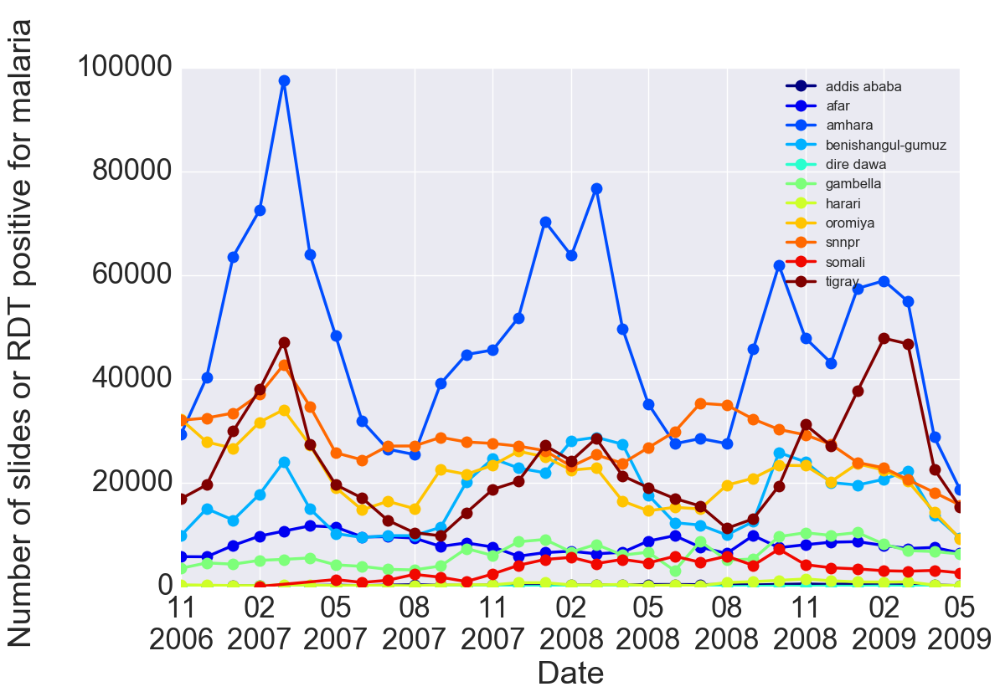

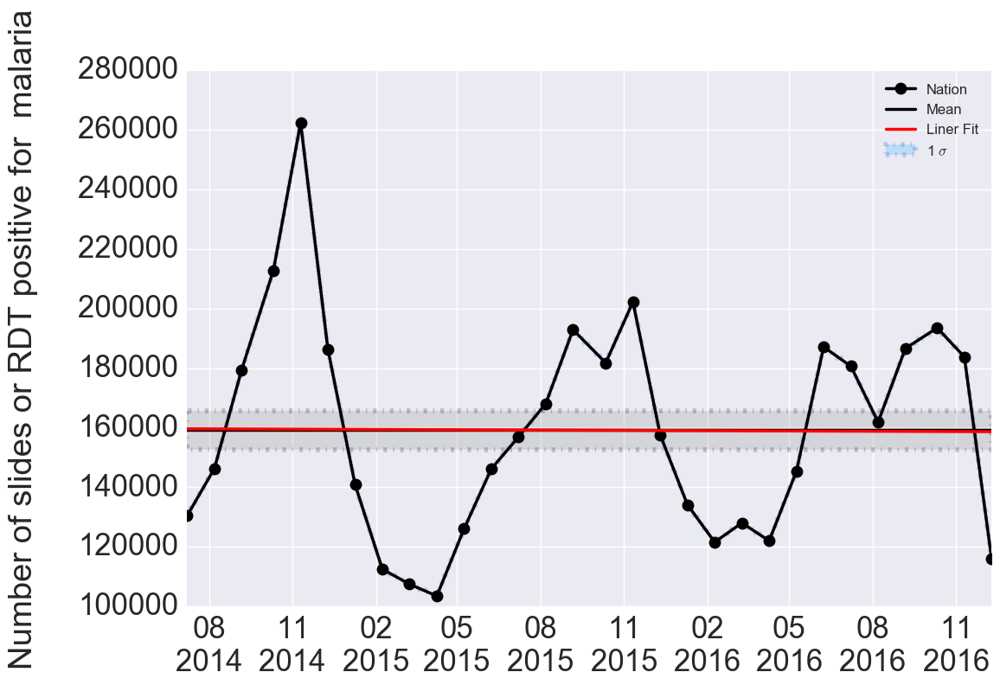

In [6]:
indicator = 'Number of slides or RDT positive for malaria'
#indicator = ind_names[3]
series_d = plot_date_indicator(DF_ind, indicator)
series_d = plot_date_indicator_nation(DF_ind, indicator, date_type='Real_Date', plt_mean=True, plt_err=True, plt_mean_std=True, x_range=[0,-1])

<h1> Setup predictive model </h1>

<h1> For prediction only use certain indicator names in the data set </h1>

<h3> Here you use all dissaggregations of malaria count. <br> make this into two seperate notebooks </h3>

In [743]:
indicator = 'Number of slides or RDT positive for malaria'

# use this for malaria rate forecasting (need to update for gender)
indicator_cut = [indicator in ind_name for ind_name in DF_ind['Indicator']]
#use this for general forecasting
#indicator_cut = [ind_name in set(ind_names) for ind_name in DF_ind['Indicator']]

#build a new dataframe from the indicator cut on the original one
#DF_shift = pd.DataFrame(DF_ind.loc[DF_ind['Indicator'].isin set(ind_names)])

DF_shift = pd.DataFrame(DF_ind.loc[indicator_cut])

In [744]:
indicators = DF_shift.groupby('Indicator').count().index
indicators

Index([u'Number of slides or RDT positive for malaria',
       u'Number of slides or RDT positive for malaria 5-14 years: Females',
       u'Number of slides or RDT positive for malaria 5-14 years: Males',
       u'Number of slides or RDT positive for malaria < 5 years: Females',
       u'Number of slides or RDT positive for malaria < 5 years: Males',
       u'Number of slides or RDT positive for malaria >=15 years: Females',
       u'Number of slides or RDT positive for malaria >=15 years: Males'],
      dtype='object', name=u'Indicator')

<h1> rename variables for old convention </h1>

In [745]:
DF_shift['prec_mm'] = DF_shift['ave_prec_mm']
DF_shift['temp'] = DF_shift['ave_temp']

<h1> add leading indicators </h1>

In [746]:
#DF_shift['val'] = DF_shift['val'] / DF_shift['val'].max()
DF_shift['val_shift_1'] = DF_shift.shift(1)['val']
#DF_shift['val_delta'] = (DF_shift['val'] - DF_shift['val_shift_1']) / DF_shift['val_shift_1']
DF_shift['infection_rate_shift_1'] = DF_shift.shift(1)['infection_rate']
DF_shift['temp_shift_1'] = DF_shift.shift(1)['temp']
DF_shift['prec_shift_1'] = DF_shift.shift(1)['prec_mm']
DF_shift['Region_shift_1'] = DF_shift.shift(1)['Region']
DF_shift['Ind_shift_1'] = DF_shift.shift(1)['Indicator']

#only makes sense when considering historical averages
DF_shift['temp_delta'] = DF_shift['temp'] - DF_shift['temp_shift_1']
DF_shift['prec_delta'] = DF_shift['prec_mm'] - DF_shift['prec_shift_1']

DF_shift['val_shift_2'] = DF_shift.shift(2)['val']
DF_shift['infection_rate_shift_2'] = DF_shift.shift(2)['infection_rate']
DF_shift['temp_shift_2'] = DF_shift.shift(2)['temp']
DF_shift['prec_shift_2'] = DF_shift.shift(2)['prec_mm']
DF_shift['Region_shift_2'] = DF_shift.shift(2)['Region']
DF_shift['Ind_shift_2'] = DF_shift.shift(2)['Indicator']

DF_shift['temp_delta_2'] = DF_shift['temp_shift_1'] - DF_shift['temp_shift_2']
DF_shift['prec_delta_2'] = DF_shift['prec_shift_1'] - DF_shift['prec_shift_2']

#val delta can not rely on the upcoming prediction. Only makes sense to go two back
DF_shift['val_delta'] = (DF_shift['val_shift_1'] - DF_shift['val_shift_2']) / DF_shift['val_shift_2']
DF_shift['infection_rate_delta'] = (DF_shift['infection_rate_shift_1'] - DF_shift['infection_rate_shift_2']) / DF_shift['infection_rate_shift_2']

<h3> Add fractional increase </h3>

In [747]:
DF_shift['val_frac'] = DF_shift['val'] / DF_shift['val_shift_1']
DF_shift['val_frac_shift_1'] = DF_shift['val_shift_1'] / DF_shift['val_shift_2']

<h1> log of indicators </h1>

In [748]:
DF_shift['log_val'] = np.log10(DF_shift['val']).replace(nan, 1/100)
DF_shift['log_val_delta'] = np.log10(DF_shift['val_delta']).replace(nan, 1/100).replace(-inf, 1/1000)
DF_shift['log_val_shift_1'] = np.log10(DF_shift['val_shift_1']).replace(nan, 1/100).replace(-inf, 1/1000)
DF_shift['log_val_shift_2'] = np.log10(DF_shift['val_shift_2']).replace(nan, 1/100).replace(-inf, 1/1000)

DF_shift['log_infection_rate'] = np.log10(DF_shift['infection_rate']).replace(nan, 1/100).replace(-inf, 1/1000)
DF_shift['log_infection_rate_shift_1'] = np.log10(DF_shift['infection_rate_shift_1']).replace(nan, 1/100).replace(-inf, 1/1000)

DF_shift['log_elevation_m'] = np.log10(DF_shift['elevation_m']).replace(nan, 1/100)
DF_shift['log_pop'] = np.log10(DF_shift['pop']).replace(nan, 1/100)
DF_shift['log_density'] = np.log10(DF_shift['density']).replace(nan, 1/100)

DF_shift['log_prec_mm'] = np.log10(DF_shift['prec_mm']).replace(nan, 1/100).replace(-inf, 1/1000)
DF_shift['log_prec_shift_1'] = np.log10(DF_shift['prec_shift_1']).replace(nan, 1/100).replace(-inf, 1/1000)
DF_shift['log_prec_shift_2'] = np.log10(DF_shift['prec_shift_2']).replace(nan, 1/100).replace(-inf, 1/1000)

DF_shift['log_prec_delta'] = np.log10(DF_shift['prec_delta']).replace(nan, 1/100).replace(-inf, 1/1000)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in log10
  from ipykernel import kernelapp as app
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: divide by zero encountered in log10
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in log10


<h3> clean up nan and region missmatch. Require the region and the indicator to be the same </h3>

In [749]:
DF_shift = DF_shift.loc[(DF_shift['Region'] == DF_shift['Region_shift_1']) &\
                      (DF_shift['Indicator'] == DF_shift['Ind_shift_1']) &\
                      (DF_shift['Region'] == DF_shift['Region_shift_2']) &\
                      (DF_shift['Indicator'] == DF_shift['Ind_shift_2']) ]


In [726]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
#from sklearn.preprocessing import OneHotEncoder
#RF = RandomForestRegressor()
RF = GradientBoostingRegressor(learning_rate=.1, n_estimators=1000)


<h1> Model the infection rate (cases normalized to population) </h1>

<h3> Split the data set into training t <= 2007 and validation t > 2008 </h3>

In [30]:
#train on 2007 data
DF_training = pd.DataFrame(DF_shift.loc[DF_shift['E_year'] <= 2007])

#all data
#DF_training = DF_shift

In [31]:
# labels:
y = DF_training.infection_rate.values


features = ['pop', 'density', 'month', 'net_frac', 'elevation_m', 'temp', 'prec_mm', 'temp_delta', 'prec_delta', \
        'val_delta', 'gen_cat', 'age_cat', 'infection_rate_shift_1', 'infection_rate_shift_2', 'infection_rate_delta',\
        'val_shift_1', 'val_shift_2', 'temp_shift_1', 'prec_shift_1', 'temp_shift_2', 'prec_shift_2']


#log_features = ['log_pop','log_density','month', 'net_frac', 'log_elevation_m', 'temp', 'log_prec_mm', 'temp_delta',\
#            'log_prec_delta', 'log_val_delta', 'gen_cat', 'age_cat', \
#            'log_infection_rate_shift_1', 'log_val_shift_1', 'log_val_delta',\
#            'temp_shift_1', 'log_prec_shift_1','log_val_shift_2', 'temp_shift_2', 'log_prec_shift_2']

# features
x = DF_training[features].values

# Fitting
RF.fit(x,y)

#Make predictions beyond 2007 to compare with data in 2008
x_all = DF_shift[features].values
prediction = RF.predict(x_all)

DF_shift['prediction'] = prediction

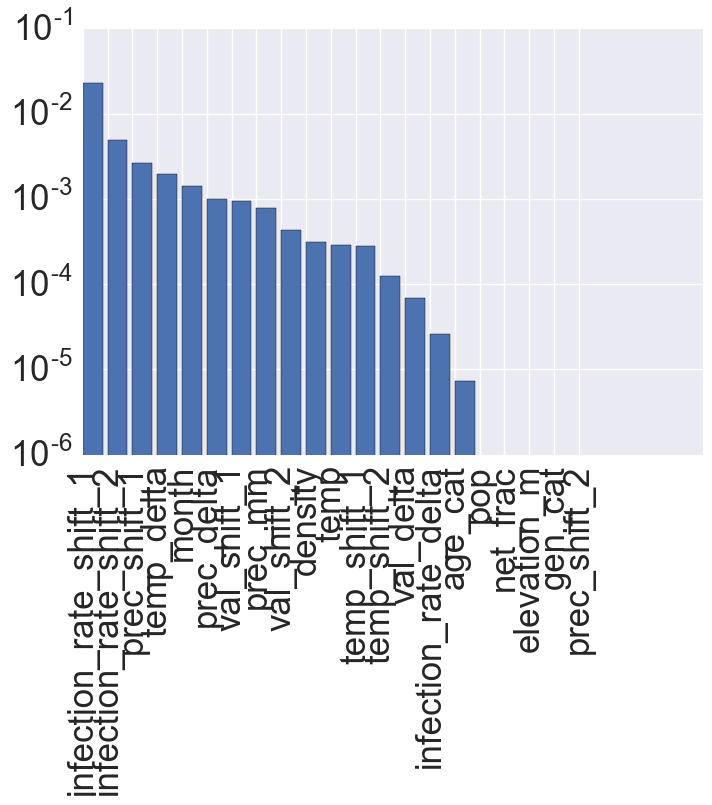

In [32]:
feature_imp = RF.feature_importances_
sorted_index = sorted(range(len(feature_imp)),key=lambda x:feature_imp[x], reverse=True)

x = range(len(feature_imp))
plt.bar(x, feature_imp[sorted_index])
xticks(x, [features[i] for i in sorted_index], rotation = 'vertical')
yscale('log')

In [33]:
indicator = 'Number of slides or RDT positive for malaria'
#series_d = plot_date_indicator(DF_ind, indicator, val_name='infection_rate')
#series_p = plot_date_indicator(DF_shift, indicator, val_name='prediction')

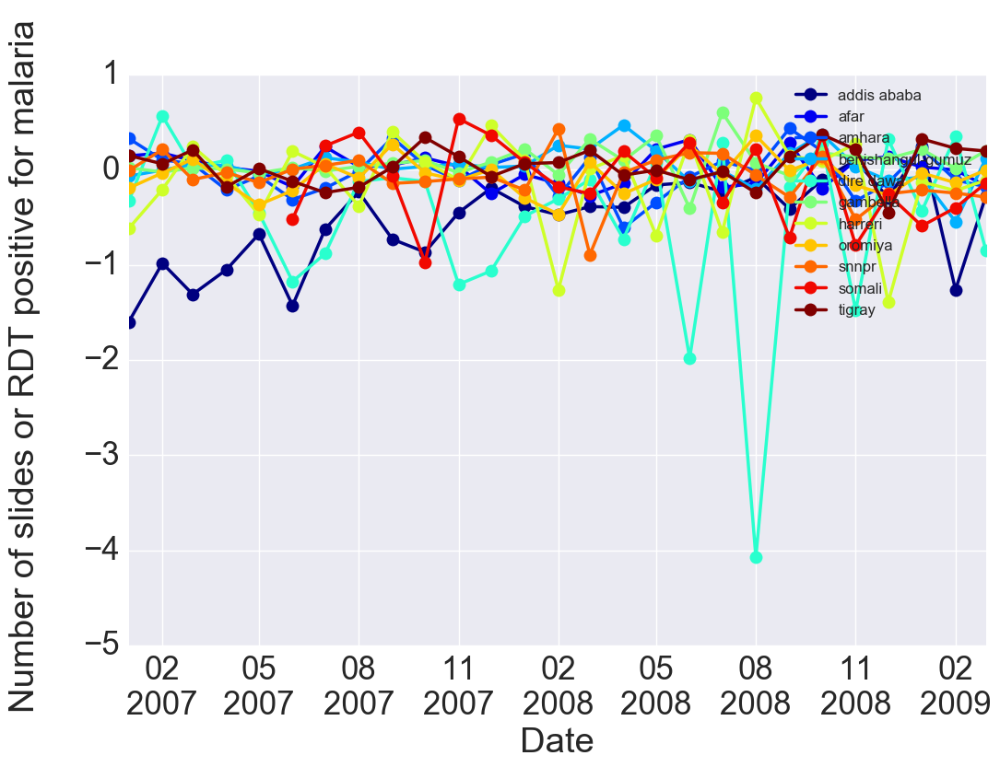

In [34]:
DF_shift['diff'] = DF_shift['infection_rate']-DF_shift['prediction']
DF_shift['norm_diff'] = (DF_shift['infection_rate']-DF_shift['prediction']) / DF_shift['infection_rate']
DF_shift['mse'] = (DF_shift['infection_rate']-DF_shift['prediction']) ** 2
series_d = plot_date_indicator(DF_shift, indicator, val_name='norm_diff')

In [35]:
sqrt(mean((DF_shift['infection_rate']-DF_shift['prediction'])**2))/mean(DF_shift['infection_rate'])

0.61183230562128499

In [36]:
sqrt(DF_shift.groupby('Region').mse.mean()) / DF_shift.groupby('Region').infection_rate.mean()*100

Region
addis ababa          401.181002
afar                  24.246263
amhara                39.063925
benishangul-gumuz     35.091861
dire dawa            231.090786
gambella              40.793470
harreri               93.633446
oromiya               43.092510
snnpr                 37.590315
somali                61.493512
tigray                36.044365
dtype: float64

<h1> plot forecast in 2008 with actual data</h1>

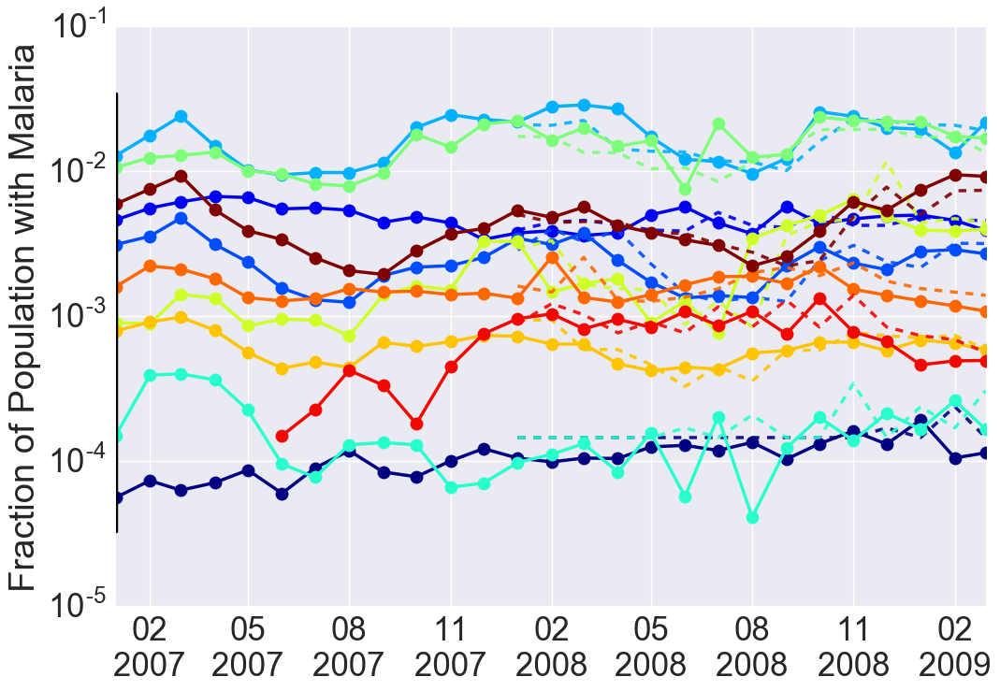

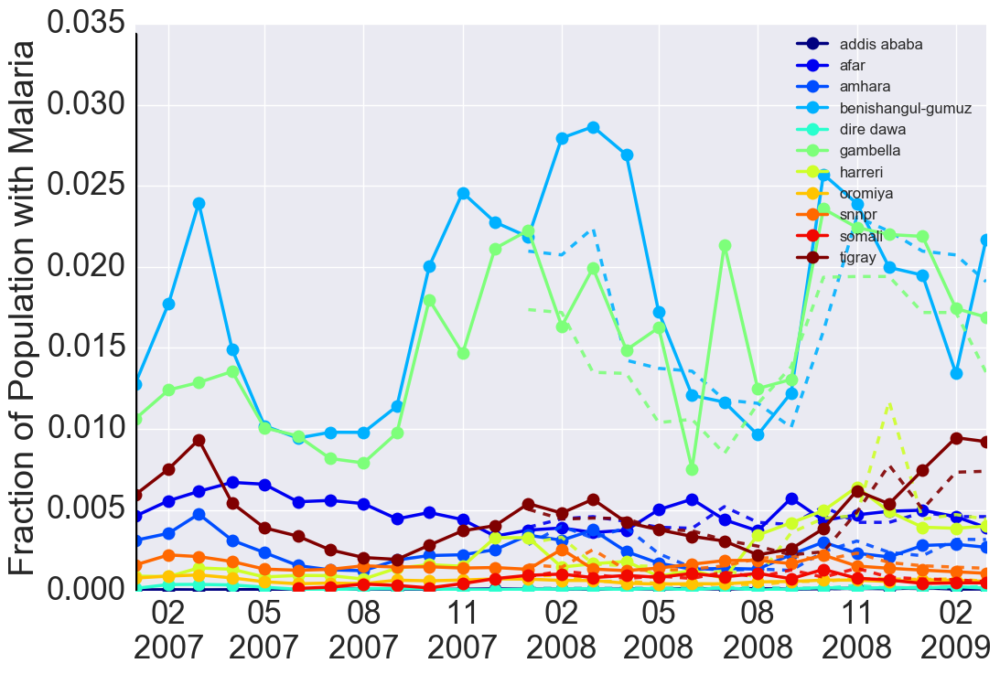

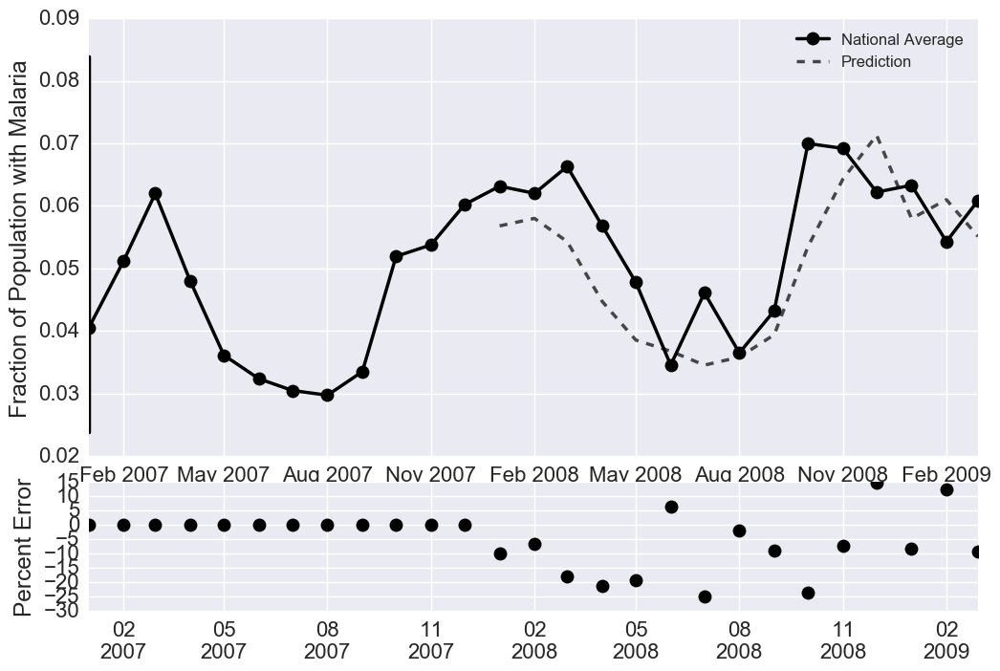

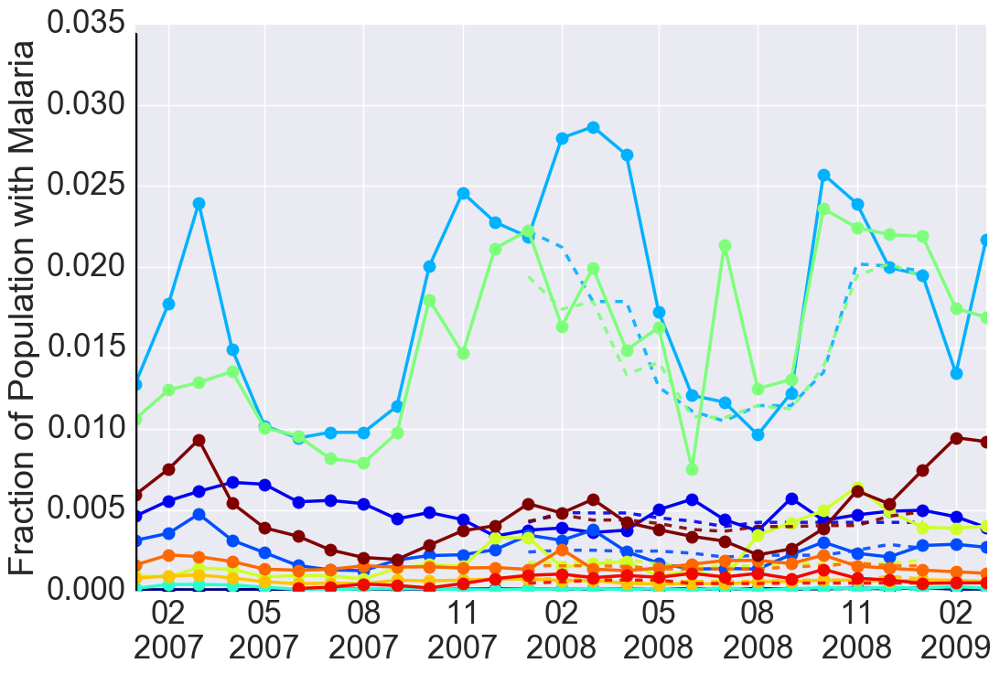

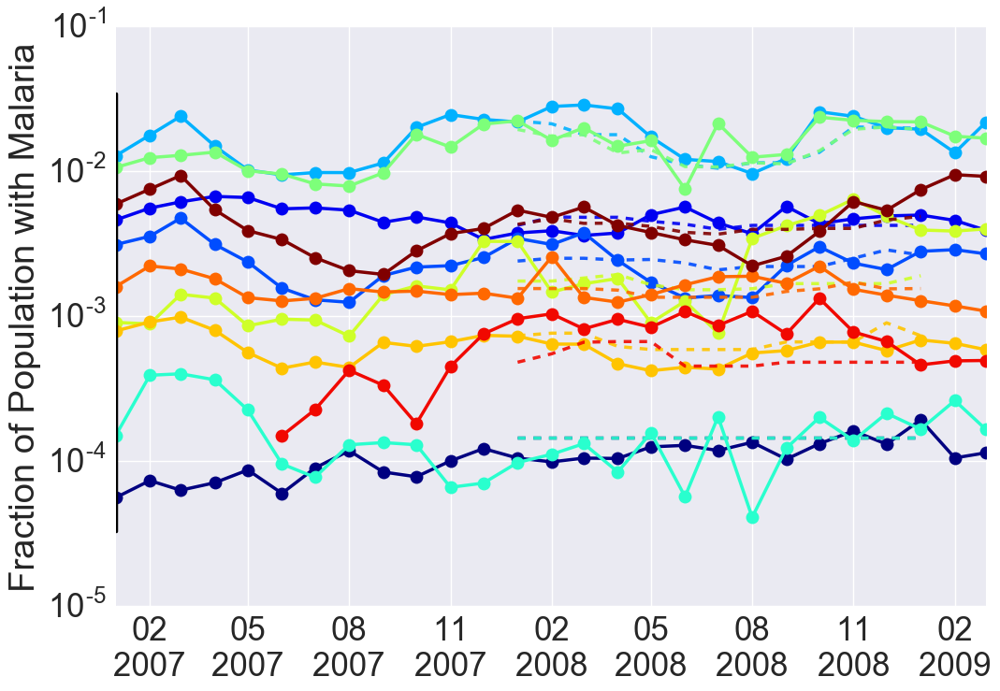

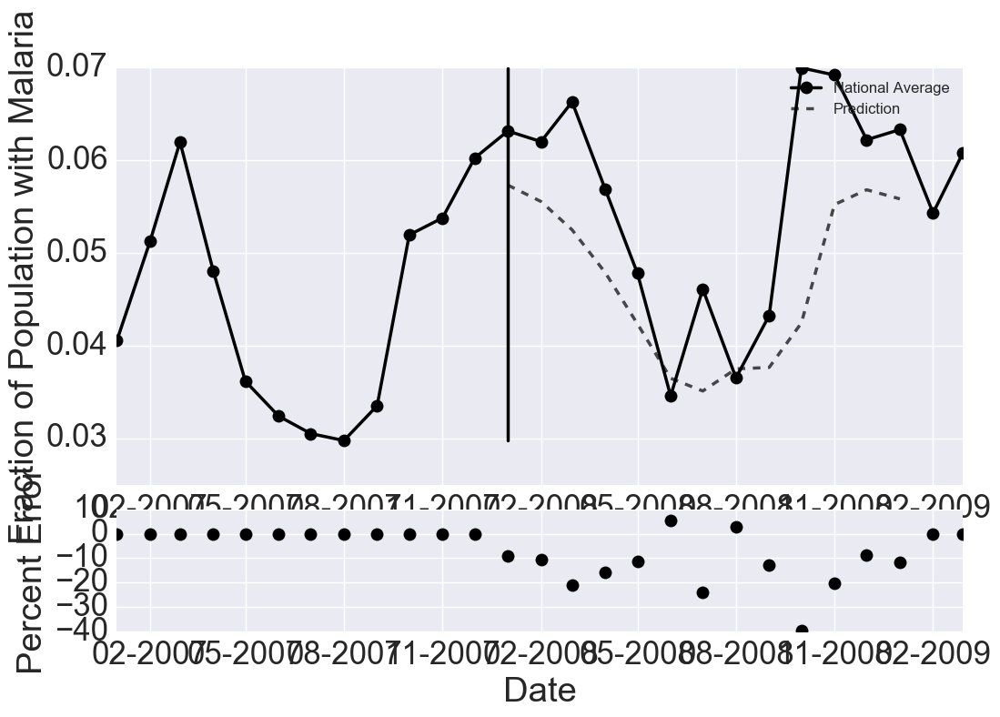

In [39]:
RMSE_zone = plot_testing(DF_shift, indicator, val_name='infection_rate', pred_name = 'prediction', train_year = 2007, logscale = True, show_leg=False, ylab='Fraction of Population with Malaria')
RMSE_zone = plot_testing(DF_shift, indicator, val_name='infection_rate', pred_name = 'prediction', train_year = 2007, logscale = False, ylab='Fraction of Population with Malaria')
to_plot, predict_plot, RMSE_n = plot_testing_nation(DF_shift, indicator, val_name='infection_rate', pred_name = 'prediction', train_year = 2007, ylab='Fraction of Population with Malaria')

# year long forecasting
ext_DF = forecast(DF_training, RF, n_months=12)
RMSE_zone_for = plot_forcasting(DF_shift, ext_DF, indicator, val_name='infection_rate', train_year = 2007, logscale = False, show_leg=False, ylab='Fraction of Population with Malaria')
RMSE_zone_for = plot_forcasting(DF_shift, ext_DF, indicator, val_name='infection_rate', train_year = 2007, logscale = True, show_leg=False, ylab='Fraction of Population with Malaria')
to_plot, predict_plot, RMSE_n_for = plot_forcast_nation(DF_shift, ext_DF, indicator, val_name='infection_rate', train_year = 2007, ylab='Fraction of Population with Malaria')


In [512]:
print RMSE_n
RMSE_zone

0.160079841079


[(u'addis ababa', 0.9470899410663336),
 (u'afar', 0.2106713201373584),
 (u'amhara', 0.2681847977036646),
 (u'benishangul-gumuz', 0.32156660857780839),
 (u'dire dawa', 0.70000975463353388),
 (u'gambella', 0.27443925264178171),
 (u'harreri', 0.592473393815516),
 (u'oromiya', 0.2856400370446458),
 (u'snnpr', 0.25967673164499794),
 (u'somali', 0.41393652823952309),
 (u'tigray', 0.24841747229596811)]

In [513]:
RMSE_n_for

0.16023354304700468

<h1> Train on all data and project one year </h1>

<h1> confidence interval </h1>

In [14]:
def pred_ints(model, X, percentile=95):
    err_down = []
    err_up = []
    for features in X:
        preds = []
        for pred in model.estimators_:
            preds.append(pred.predict(features.reshape(1, -1))[0])
        err_down.append(np.percentile(preds, (100 - percentile) / 2. ))
        err_up.append(np.percentile(preds, 100 - (100 - percentile) / 2.))
    return err_down, err_up

<h1> claculate error one month out, prevent overfitting </h1>

<h1> build several models to prevent overfitting</h1>

<h3> National level average error </h3>

In [135]:
DF_testing[DF_testing['Indicator'] == indicators[4]].groupby('Real_Date').sum()\
    .groupby(level=0).apply(lambda x: (x.val - x.prediction) / x.val)

Real_Date   Real_Date 
2016-03-10  2016-03-10    0.088250
2016-04-09  2016-04-09   -0.099377
2016-05-09  2016-05-09   -0.086817
2016-06-08  2016-06-08    0.096752
2016-07-08  2016-07-08   -0.131112
2016-08-07  2016-08-07   -0.236065
2016-09-06  2016-09-06   -0.064478
2016-10-11  2016-10-11    0.037721
2016-11-10  2016-11-10   -0.129093
2016-12-10  2016-12-10   -0.258281
2017-01-09  2017-01-09   -0.190523
dtype: float64

<h3> Natinoal all indicators. RMSE on testing set </h3>

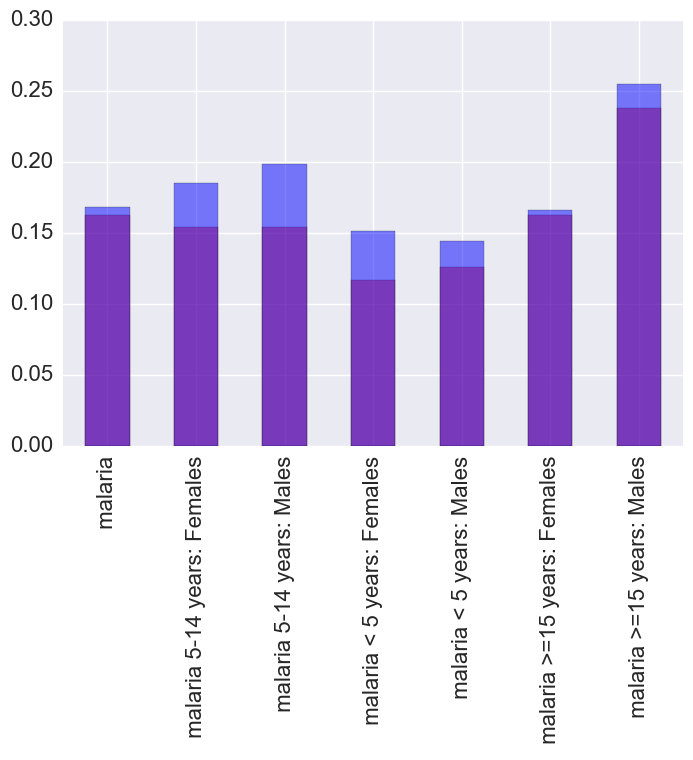

In [973]:
DF_testing = pd.concat(tests[2], ignore_index=True)

'''# Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
nation_rmse = DF_testing.groupby(['Indicator', 'Real_Date']).sum()\
    .groupby(level=0).apply(lambda x: np.sqrt((((x.val - x.prediction_m_18) / x.val)**2).mean()))
    
nation_rmse.index = [val.split('for')[-1] for val in nation_rmse.index]
nation_rmse.plot.bar(color = 'k', alpha=.1)
'''
#################################################################
DF_testing = pd.concat(tests[2], ignore_index=True)

# Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
nation_rmse = DF_testing.groupby(['Indicator', 'Real_Date']).sum()\
    .groupby(level=0).apply(lambda x: np.sqrt((((x.val - x.prediction_m_12) / x.val)**2).mean()))
    
nation_rmse.index = [val.split('for')[-1] for val in nation_rmse.index]
nation_rmse.plot.bar(color='r', alpha=0.5)

#################################################################
DF_testing = pd.concat(tests[1], ignore_index=True)

# Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
nation_rmse = DF_testing.groupby(['Indicator', 'Real_Date']).sum()\
    .groupby(level=0).apply(lambda x: np.sqrt((((x.val - x.prediction_m_6) / x.val)**2).mean()))
    
nation_rmse.index = [val.split('for')[-1] for val in nation_rmse.index]
nation_rmse.plot.bar(color='b', alpha=0.5)

<h1> Regional level RMSE </h1>

In [976]:
# Sum over all the regions that make up the national indicator... after the sum, groupby by level 0
region_rmse = DF_testing.groupby(['Region', 'Indicator'])\
    .apply(lambda x: np.sqrt((((x.val - x.prediction_m_6) / x.val)**2).mean()))

In [981]:
from matplotlib.colors import LogNorm

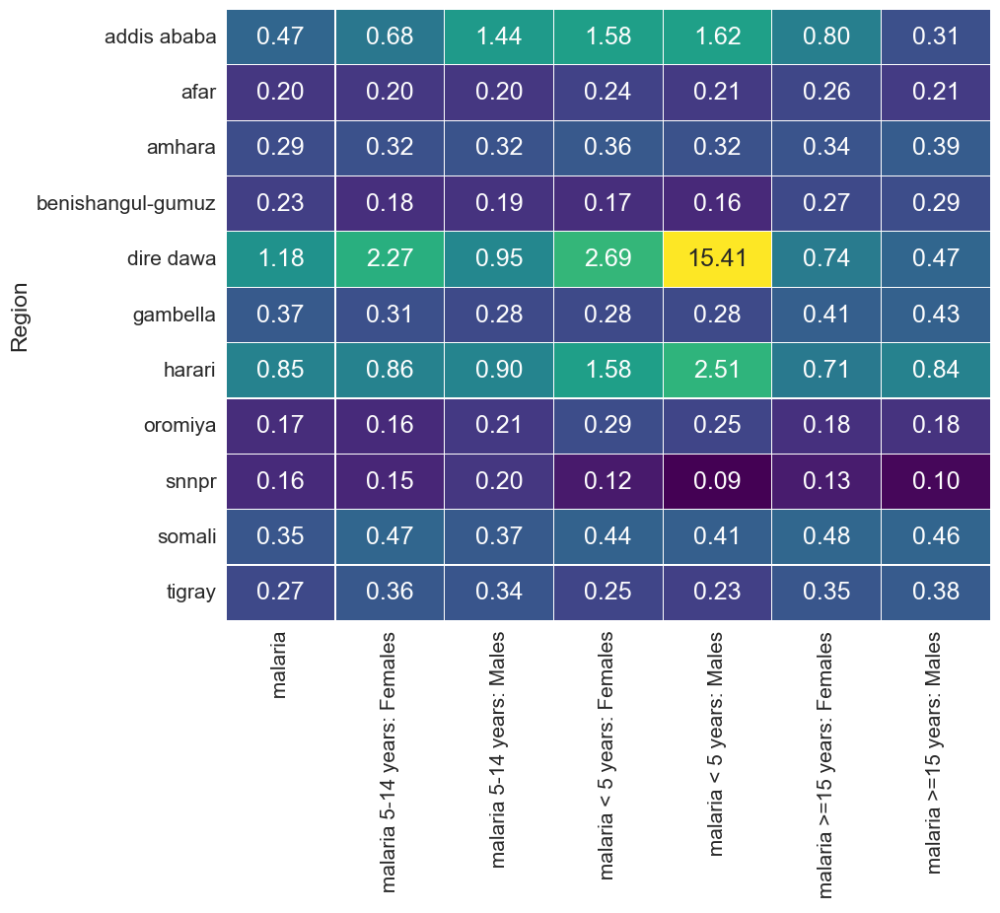

In [990]:
result = region_rmse.reset_index().pivot(index='Region', columns='Indicator', values=0).replace(np.nan,0)
result.columns=[val.split('for')[-1] for val in result.columns]
fig=figure()
fig.set_size_inches(10, 8)
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
sns.heatmap(result, annot=True, fmt=".2f", cmap='viridis', label='big',\
            square=False,linewidths=0.1, cbar=False, norm=LogNorm(vmin=result.min(), vmax=result.max())) #ListedColormap(['red','green', 'red']) #vmin=0,vmax=1.5
#plt.title('{:s}\n Date: {:s}'.format(title, str(ind)))
plt.show()

<h1> Make a model for each region and each indicator </h1>

In [468]:
regions = DF_shift.groupby('Region').count().index
for region in regions:
    DF_training = pd.DataFrame(DF_shift[(DF_shift['E_Date'] < end_date - pd.offsets.relativedelta(months=offset)) \
                            & (DF_shift['Region'] == region)])
#DF_training

In [614]:
from collections import defaultdict

In [916]:
#RF = RandomForestRegressor(n_estimators=100, warm_start=False)
#RF = GradientBoostingRegressor(n_estimators=100, alpha=0.1, warm_start=True)

features = ['density','month', 'elevation_m', 'net_frac', 'temp', 'prec_mm', 'temp_delta', 'prec_delta', \
              'val_delta', 'val_shift_1', 'temp_shift_1', 'prec_shift_1', \
              'val_shift_2', 'temp_shift_2', 'prec_shift_2', 'gen_cat', 'age_cat']

#features = ['density', 'val_frac_shift_1','val_delta', 'val_shift_1', 'val_shift_2',\
#            'month', 'temp', 'prec_mm', 'prec_shift_1', 'prec_shift_2', 'temp_shift_1', 'temp_shift_2']#


end_date = pd.datetime(2009,1,1)
pred_shifts = range(0, 19, 6)

trains = defaultdict(list)
tests = defaultdict(list)
shifts = []

        
#for region in regions:
for region in regions:
    #df_cut = (DF_shift['Region'] == region) & (DF_shift['Indicator'] == indicator)
    #df_cut = (DF_shift['Indicator'] == indicator)
    df_cut = (DF_shift['Region'] == region)
    DF_shift_region = pd.DataFrame(DF_shift[df_cut])
    DF_shift_region_cut = pd.DataFrame(DF_shift[df_cut])

    for i, offset in enumerate(pred_shifts):
        poststr = ''
        if offset != 0:
            poststr = '_m_%s' % offset
        prediction_str = 'prediction%s' % poststr
        prediction_upper_str = 'prediction_upper%s' % poststr
        prediction_lower_str = 'prediction_lower%s' % poststr

        # Cut on new offset
        DF_training = DF_shift_region_cut[DF_shift_region_cut['E_Date'] <= end_date - pd.offsets.relativedelta(months=offset)]
        DF_testing = DF_shift_region_cut.drop(DF_training.index)

        RF = RandomForestRegressor(n_estimators=10, warm_start=False)
        #RF = GradientBoostingRegressor()
        # Training:
        y = DF_training.val.values
        xtrain = DF_training[features].values
        RF.fit(xtrain, y)

        DF_training[prediction_str] = RF.predict(xtrain)
        trains[i].append(DF_training)
        #err_up, err_down = pred_ints(RF, xtrain, percentile=68)
        #DF_training[prediction_upper_str] = err_up
        #DF_training[prediction_lower_str] = err_down

        # Testing:
        xtest = DF_testing[features].values
        DF_testing[prediction_str] = RF.predict(xtest)
        tests[i].append(DF_testing)

        #Make predictions beyond 2007 to compare with data in 2008
        x_all = DF_shift_region[features].values

        DF_shift_region[prediction_str] = RF.predict(x_all)

    # Shifts contain all information. Split up by time and prediction postfix later
    shifts.append(DF_shift_region)

        # Recursive forecast to up to one year:
        #ext_DF, forecast_DF = forecast(DF_training, RF, n_months=12)
        
        
#DF_training = pd.concat(trains, ignore_index=True)
#DF_testing = pd.concat(tests, ignore_index=True)
DF_shift_region = pd.concat(shifts, ignore_index=True)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [917]:
DF_training = pd.concat(trains[2], ignore_index=True)
DF_testing = pd.concat(tests[2], ignore_index=True)

<h1> Single model for all regions </h1>

In [953]:
features = ['density','month', 'elevation_m', 'net_frac', 'temp', 'prec_mm', 'temp_delta', 'prec_delta', \
              'val_delta', 'val_shift_1', 'temp_shift_1', 'prec_shift_1', \
              'val_shift_2', 'temp_shift_2', 'prec_shift_2', 'gen_cat', 'age_cat']

#features = ['density', 'val_shift_1', 'val_shift_2', 'prec_shift_2', 'gen_cat', 'age_cat']


end_date = pd.datetime(2009,1,1)
pred_shifts = range(0, 13, 6)

trains = defaultdict(list)
tests = defaultdict(list)
DF_shift_all = DF_shift

for i, offset in enumerate(pred_shifts):
    DF_training = pd.DataFrame(DF_shift[DF_shift['E_Date'] < \
                end_date - pd.offsets.relativedelta(months=offset)])
    DF_testing = DF_shift.drop(DF_training.index)
    
    poststr = ''
    if offset != 0:
        poststr = '_m_%s' % offset
    prediction_str = 'prediction%s' % poststr
    prediction_upper_str = 'prediction_upper%s' % poststr
    prediction_lower_str = 'prediction_lower%s' % poststr
    
    RF = RandomForestRegressor(n_estimators=100, warm_start=False)
    #RF = GradientBoostingRegressor()
    # Training:
    y = DF_training.val.values
    xtrain = DF_training[features].values
    RF.fit(xtrain, y)

    DF_training[prediction_str] = RF.predict(xtrain) # * DF_training['val_shift_1']
    trains[i].append(DF_training)
    #err_up, err_down = pred_ints(RF, xtrain, percentile=68)
    #DF_training[prediction_upper_str] = err_up
    #DF_training[prediction_lower_str] = err_down

    # Testing:
    xtest = DF_testing[features].values
    DF_testing[prediction_str] = RF.predict(xtest) # * DF_testing['val_shift_1']
    tests[i].append(DF_testing)
    #err_up, err_down = pred_ints(RF, xtest, percentile=68)
    #DF_testing[prediction_upper_str] = err_up
    #DF_testing[prediction_lower_str] = err_down

    #Make predictions beyond 2007 to compare with data in 2008
    x_all = DF_shift_all[features].values

    DF_shift_all[prediction_str] = RF.predict(x_all) # * DF_shift_all['val_shift_1']

In [969]:
DF_training = pd.concat(trains[2])
DF_testing = pd.concat(tests[2])

<h1> Plot training testing validation sperately </h1>

<h3> Loop through all regions + nation and indicators and make plots... then plot RMSE </h3>

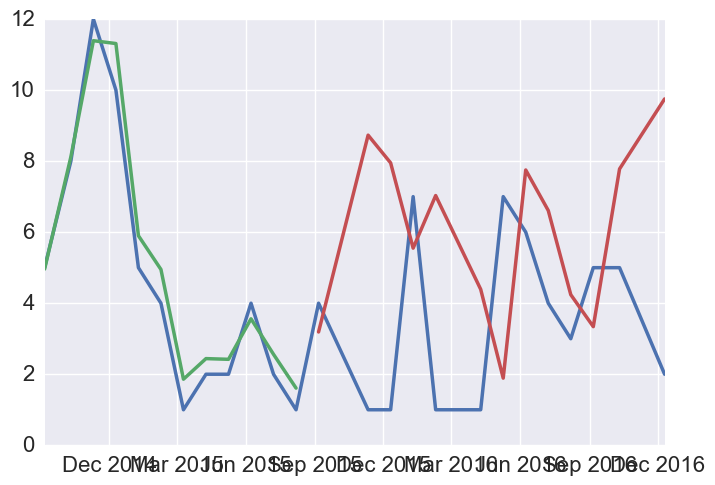

In [970]:
#plt.plot(DF_shift[DF_shift['Indicator'] == indicators[4]].groupby('Real_Date').sum().val)
plt.plot(DF_shift_region[(DF_shift_region['Indicator'] == indicators[1]) & (DF_shift_region['Region'] == 'dire dawa')].groupby('Real_Date').sum().val)
plt.plot(DF_training[(DF_training['Indicator'] == indicators[1]) & (DF_training['Region'] == 'dire dawa')].groupby('Real_Date').sum().prediction_m_12)
plt.plot(DF_testing[(DF_testing['Indicator'] == indicators[1]) & (DF_testing['Region'] == 'dire dawa')].groupby('Real_Date').sum().prediction_m_12)
#plt.plot(DF_testing[(DF_testing['Indicator'] == indicators[0]) & (DF_testing['Region'] == 'dire dawa')].groupby('Real_Date').sum().prediction_m_12)

<h1> plot and save figures </h1>

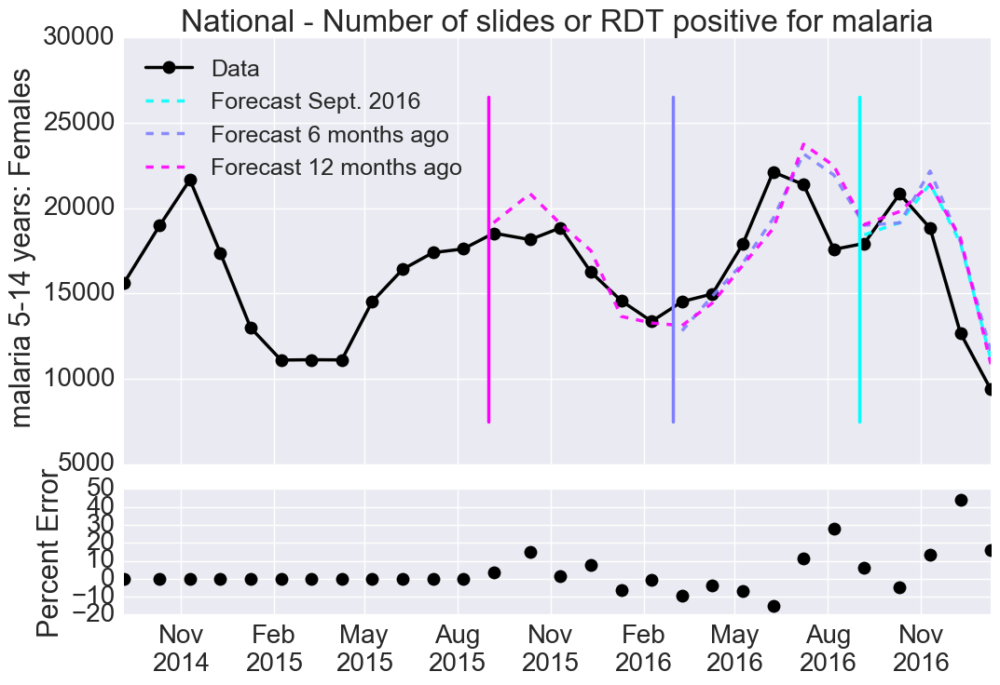

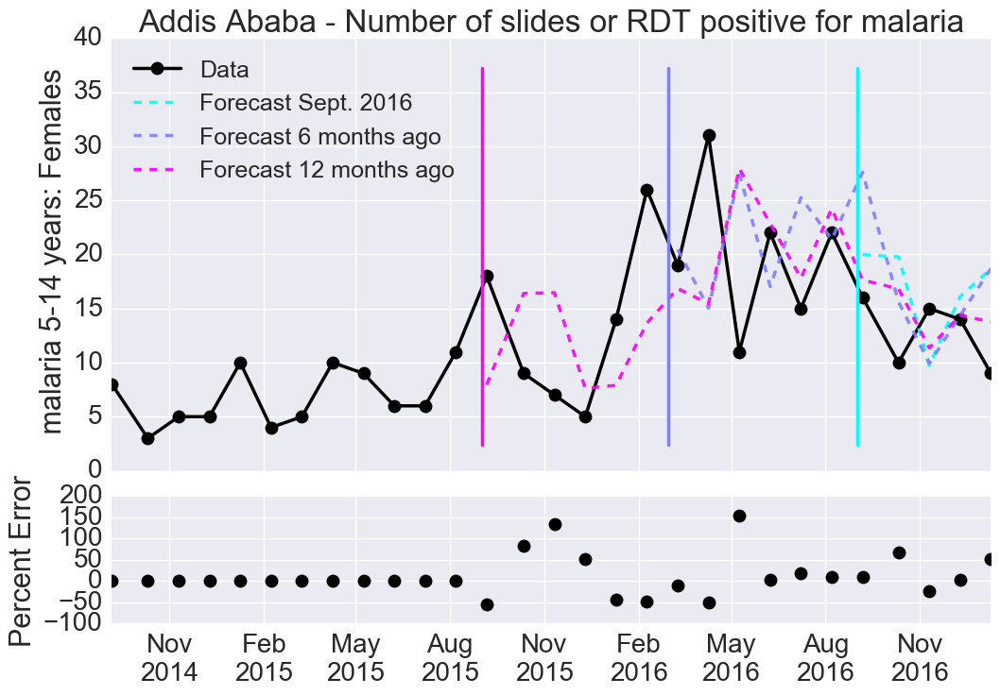

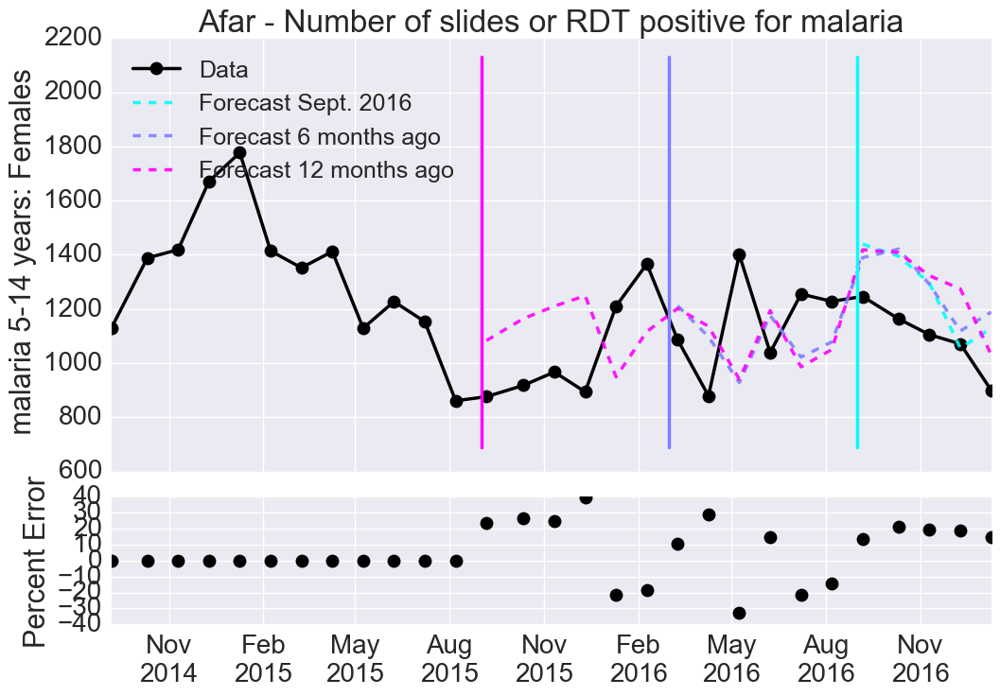

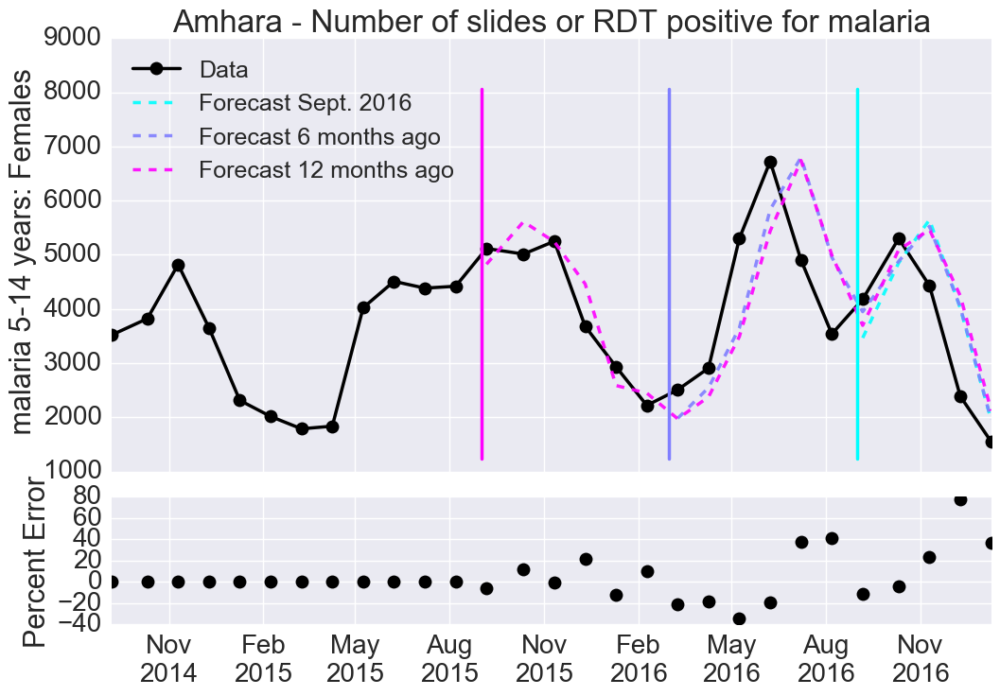

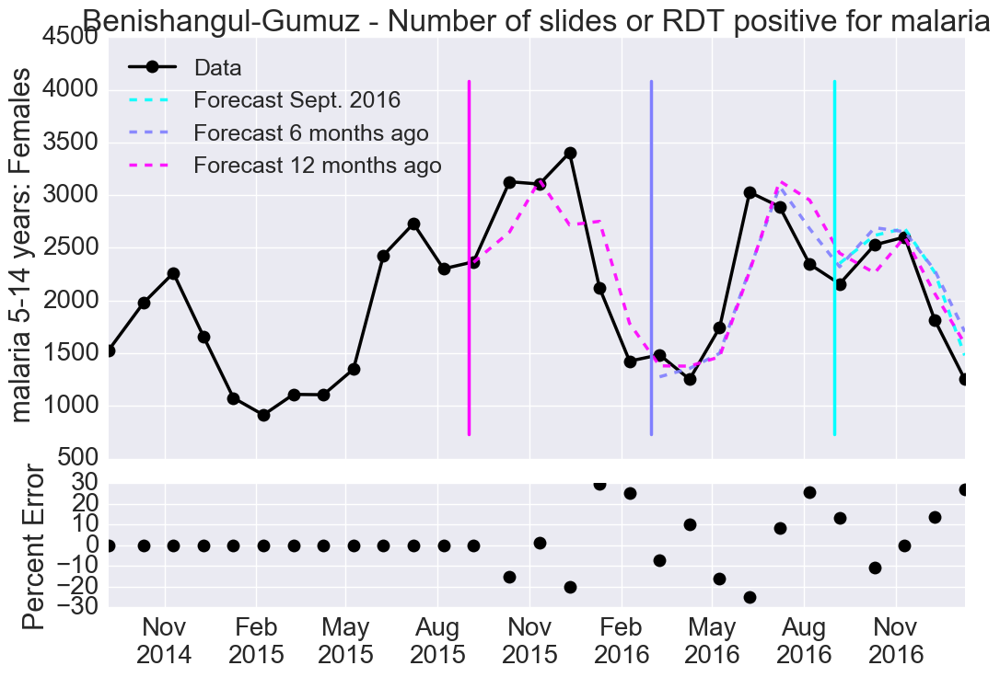

...

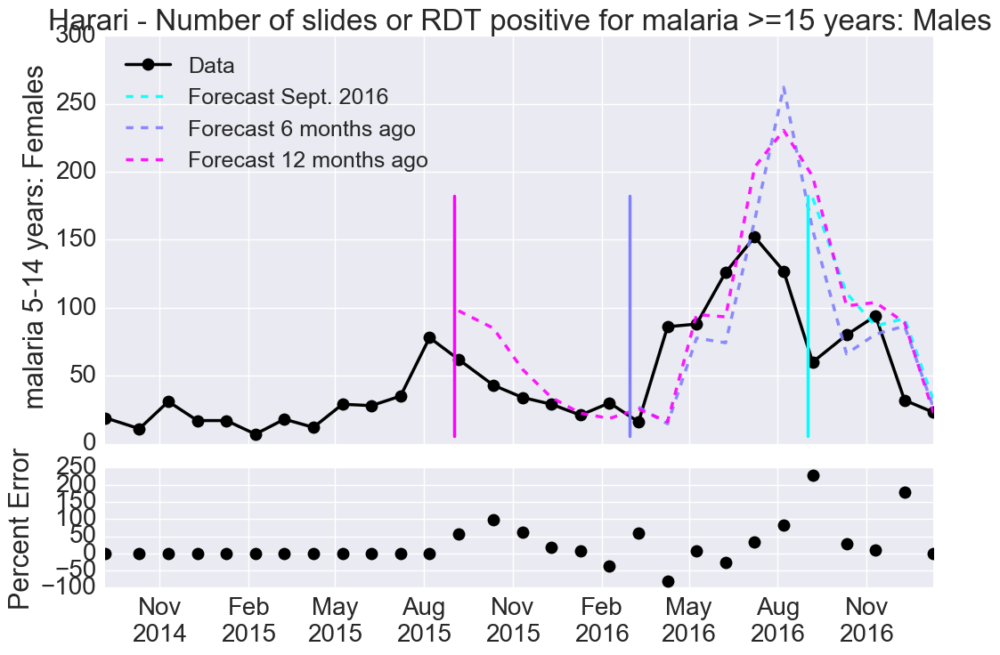

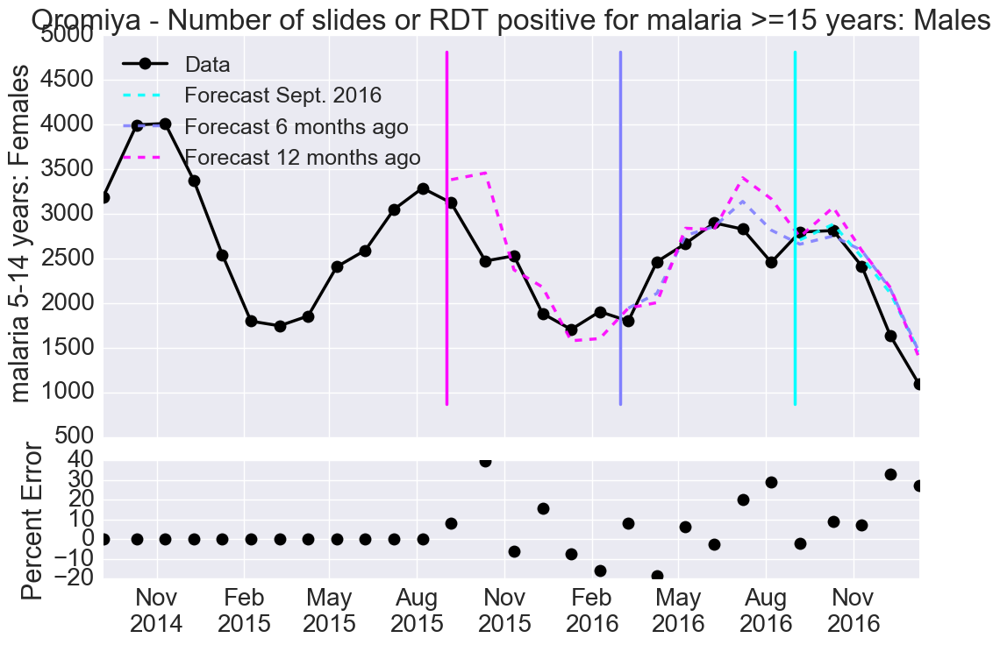

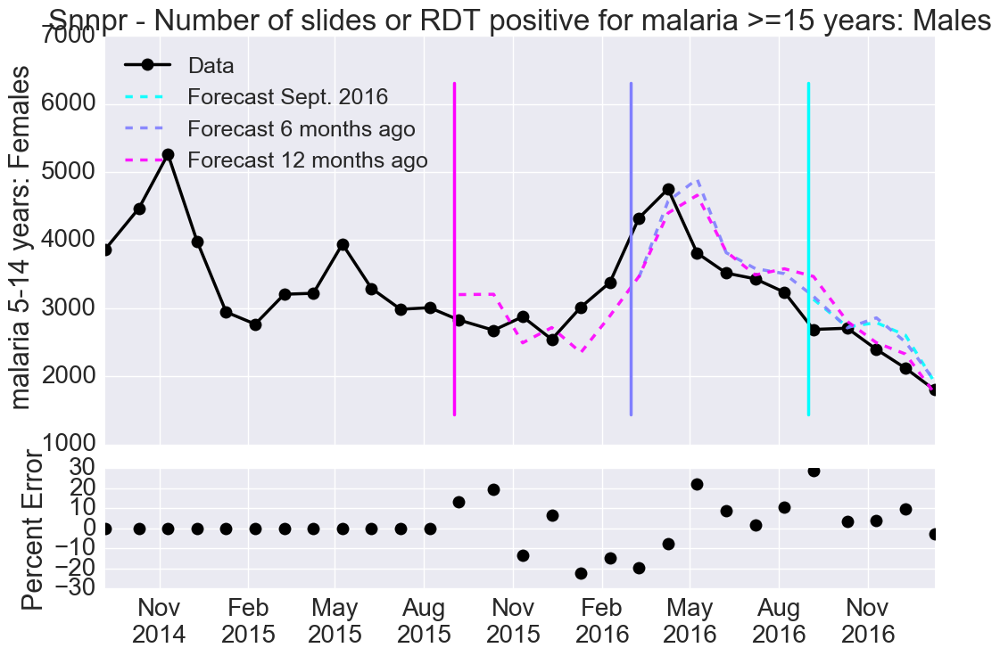

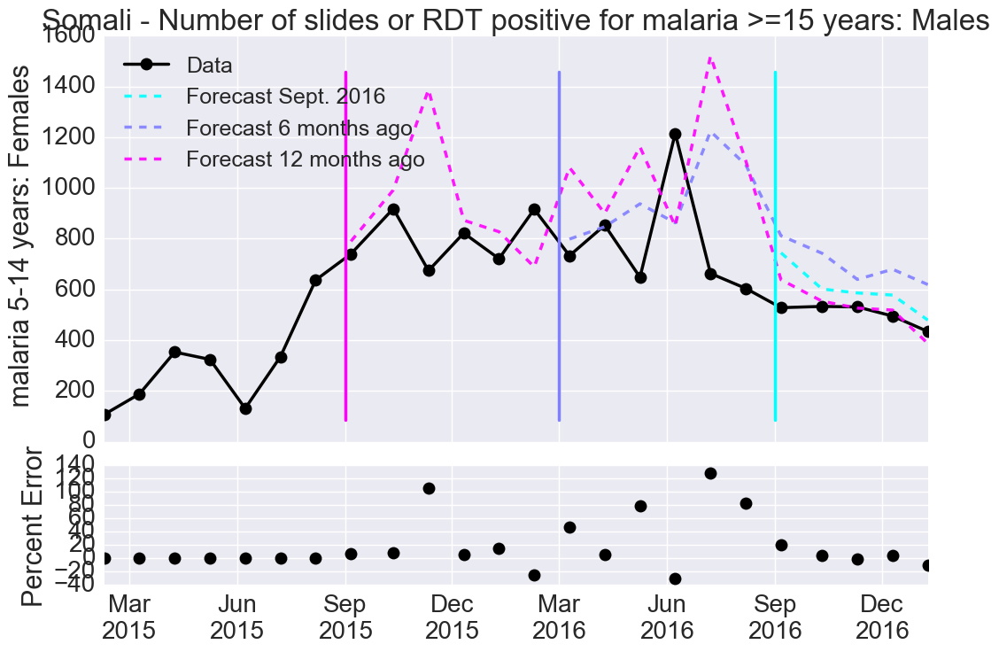

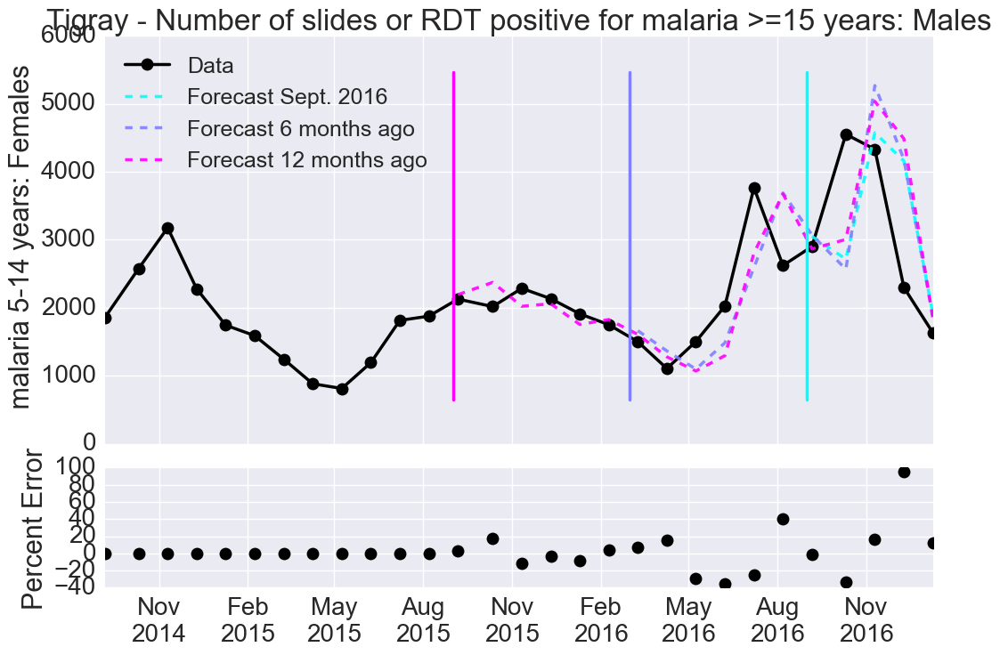

In [1031]:
#RMSE_zone = plot_testing(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2006, horz_line = (2016,9), logscale = False)

horz_lines = [(2016,9), (2016,3), (2015,9), (2015,3)][:len(pred_shifts)]

#plotting_df = DF_shift_region
plotting_df = DF_shift_all

indiator = indicators[1]
pred_text = ['Forecast Sept. 2016', 'Forecast 6 months ago', 'Forecast 12 months ago']

for indicator in indicators:
    to_plot, predict_plot, RMSE_n = plot_testings_nation(plotting_df, indiator, date_type='Real_Date', val_name='val',\
                        pred_name = 'prediction', pred_shifts=pred_shifts, training_end = (2008, 12),  \
                        horz_lines = horz_lines, cf_band=False, cmap=cm.cool, \
                        title = 'National - %s' % (indicator), pred_text=pred_text)
    plt.savefig('malaria_1m_testing/nation_%s.png' % (indicator))

    for region in regions:
        to_plot, predict_plot, RMSE_n = plot_testings_nation(plotting_df[plotting_df['Region']==region], \
                        indiator, date_type='Real_Date', val_name='val',\
                        pred_name = 'prediction', pred_shifts=pred_shifts, training_end = (2008, 12),  \
                        horz_lines = horz_lines, cf_band=False, cmap=cm.cool, \
                        title= '%s - %s' % (region.title(), indicator), pred_text=pred_text)
        plt.savefig('malaria_1m_testing/%s_%s.png' % (region, indicator))


## 

<h1> Predicting Malaria Count </h1>

<h1> Simplified model </h1> 

In [348]:
RF = RandomForestRegressor(n_estimators=100, warm_start=True)
#RF = GradientBoostingRegressor(learning_rate=.1, n_estimators=1000)

In [354]:
#train on 2007 data
DF_training = DF_shift[DF_shift['E_Date'] < pd.datetime(2008,1,1)]
DF_testing = DF_shift.drop(DF_training.index)

# Sample indicies randomly:
#DF_training = DF_shift.loc[DF_shift['E_year'] < 2009].sample(frac=0.6, replace=False)
#DF_testing = DF_shift.loc[DF_shift['E_year'] < 2009].drop(DF_training.index)

#all data
#DF_training = DF_shift

In [355]:
features = ['density','month', 'elevation_m', 'net_frac', 'temp', 'prec_mm', 'temp_delta', 'prec_delta', \
              'val_delta', 'val_shift_1', 'temp_shift_1', 'prec_shift_1', \
              'val_shift_2', 'temp_shift_2', 'prec_shift_2', 'gen_cat', 'age_cat']

#features = ['pop','density','month', 'elevation_m', 'net_frac', 'temp', 'prec_mm', 'temp_delta', 'prec_delta', \
#              'val_delta', 'val_shift_1', 'temp_shift_1', 'prec_shift_1', \
#              'val_shift_2', 'temp_shift_2', 'prec_shift_2', 'gen_cat', 'age_cat']
# Training:
y = DF_training.val.values
xtrain = DF_training[features].values
RF.fit(xtrain, y)

DF_training['prediction'] = RF.predict(xtrain)
err_up, err_down = pred_ints(RF, xtrain, percentile=68)
DF_training['prediction_upper'] = err_up
DF_training['prediction_lower'] = err_down

# Testing:
xtest = DF_testing[features].values
DF_testing['prediction'] = RF.predict(xtest)
err_up, err_down = pred_ints(RF, xtest, percentile=68)
DF_testing['prediction_upper'] = err_up
DF_testing['prediction_lower'] = err_down


#Make predictions beyond 2007 to compare with data in 2008
x_all = DF_shift[features].values

DF_shift['prediction'] = RF.predict(x_all)
err_up, err_down = pred_ints(RF, x_all, percentile=68)
DF_shift['prediction_upper'] = err_up
DF_shift['prediction_lower'] = err_down



/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-vers

In [356]:
# compare prediction to values (RMSE validation)

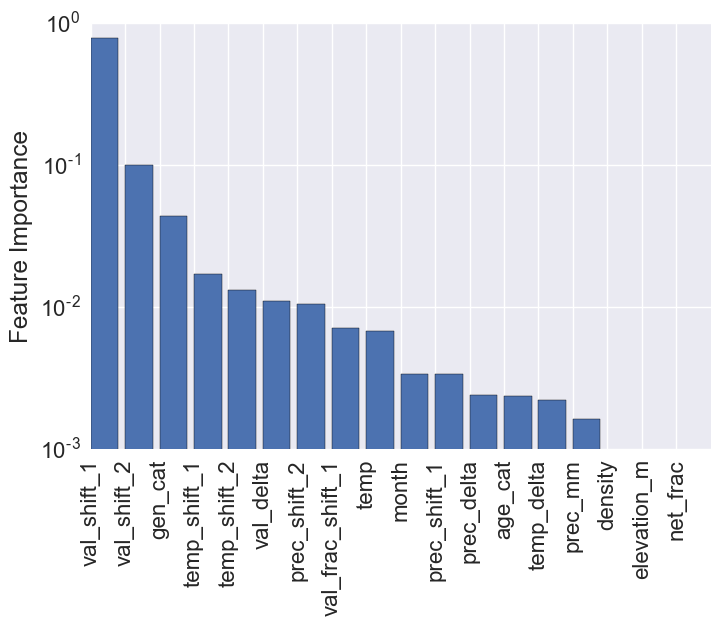

In [831]:
feature_imp = RF.feature_importances_
sorted_index = sorted(range(len(feature_imp)),key=lambda x:feature_imp[x], reverse=True)

xx = range(len(feature_imp))
plt.bar(xx, feature_imp[sorted_index])
xticks(xx, [features[i] for i in sorted_index], rotation = 'vertical')
ylabel('Feature Importance')
yscale('log')

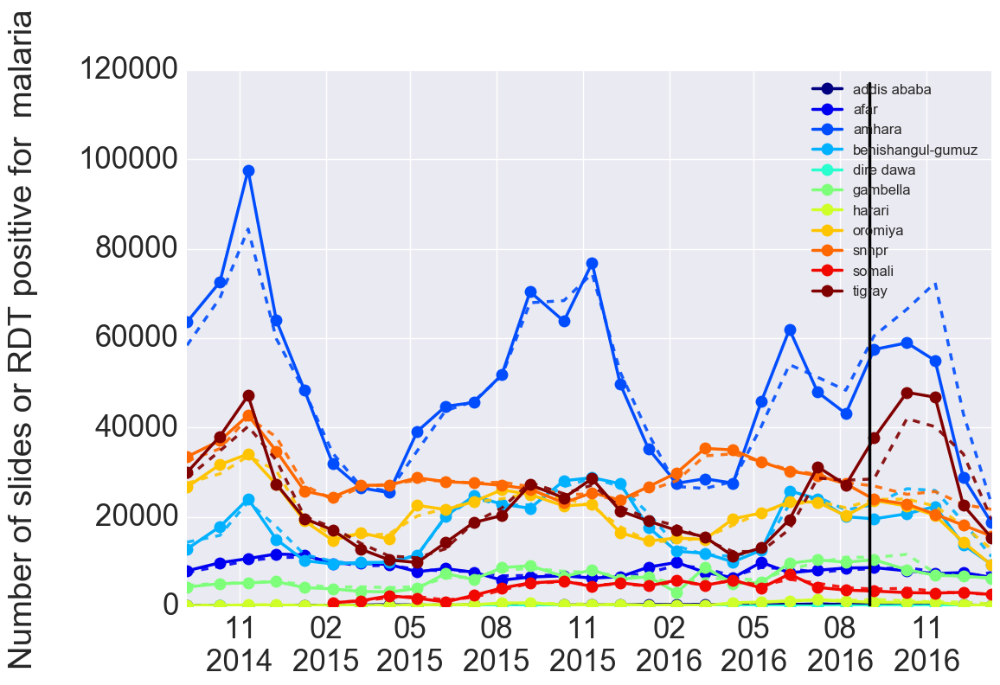

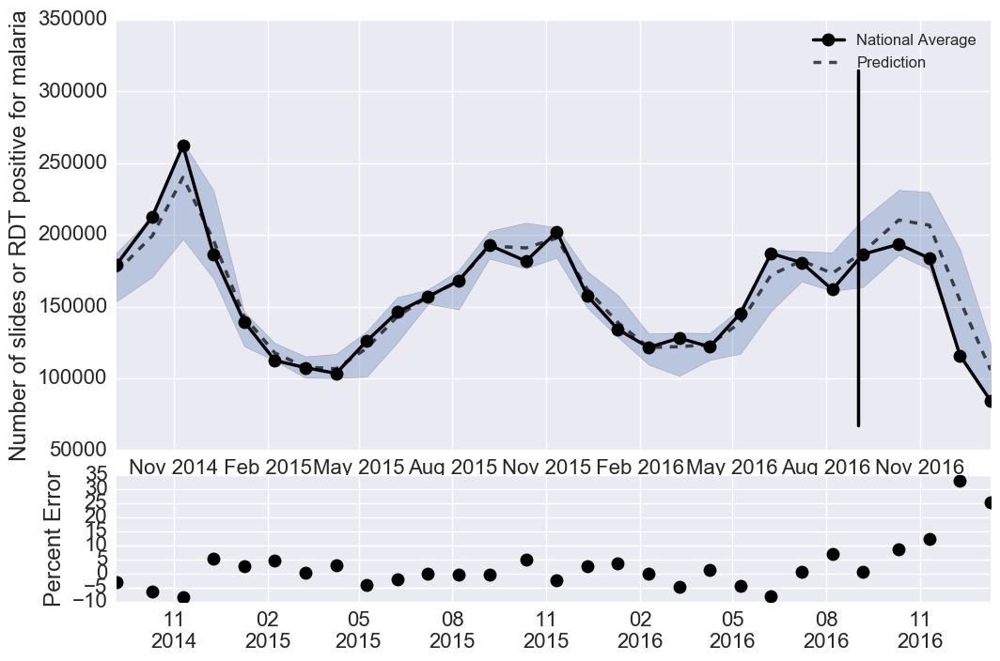

In [358]:
RMSE_zone = plot_testing(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2006, horz_line = (2016,9), logscale = False)
to_plot, predict_plot, RMSE_n = plot_testing_nation(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2006,  horz_line = (2016,9), cf_band=True)

NameError: name 'forecast' is not defined

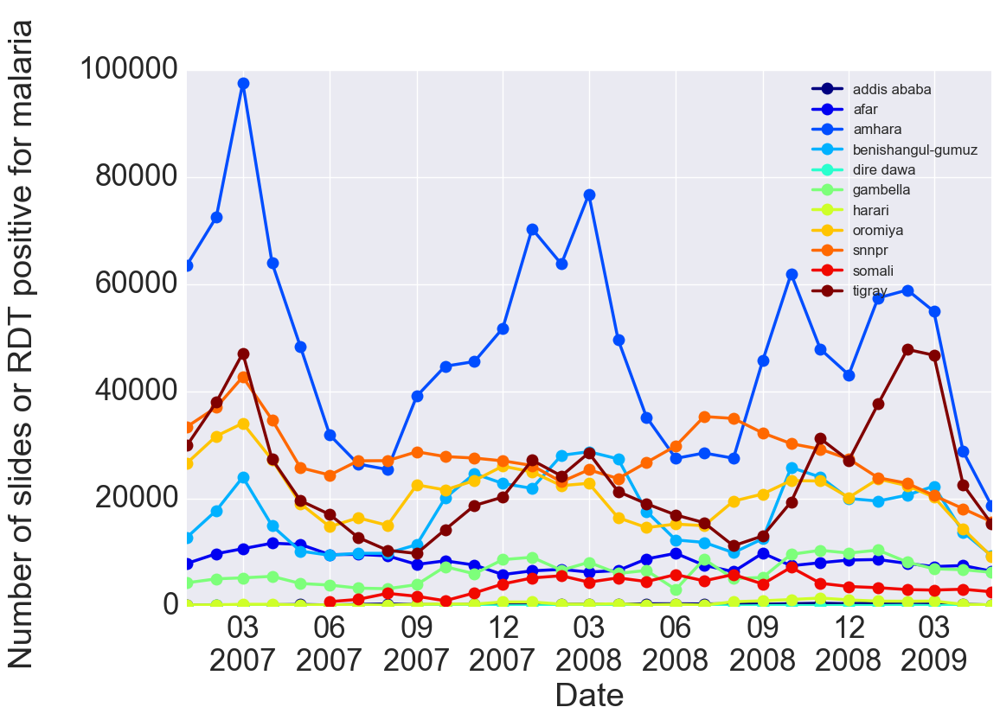

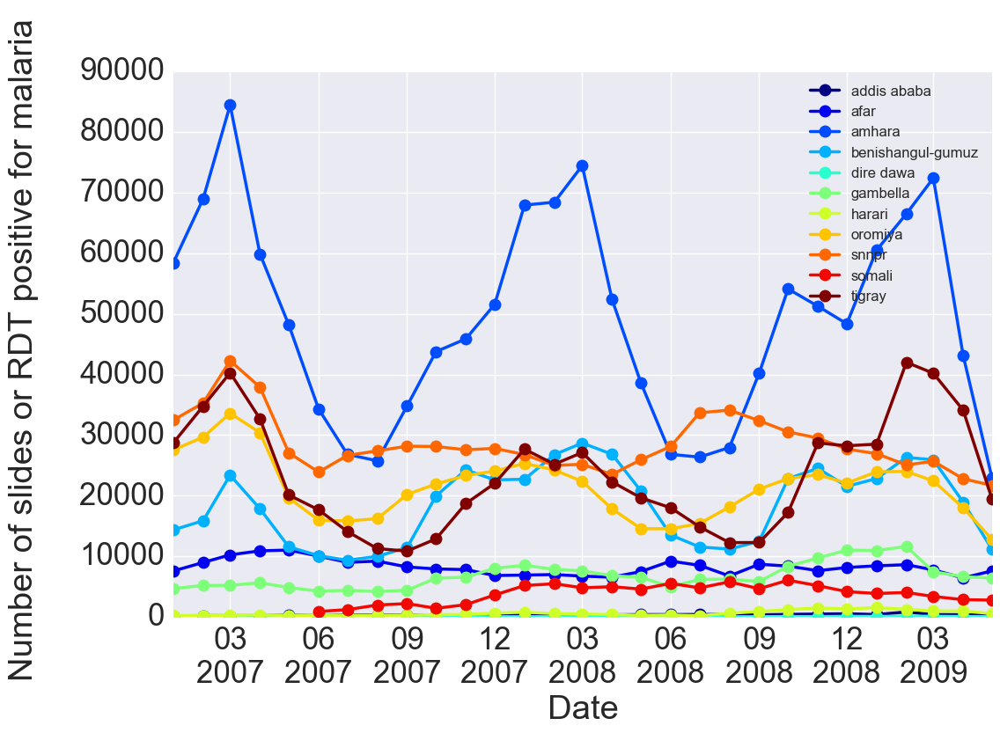

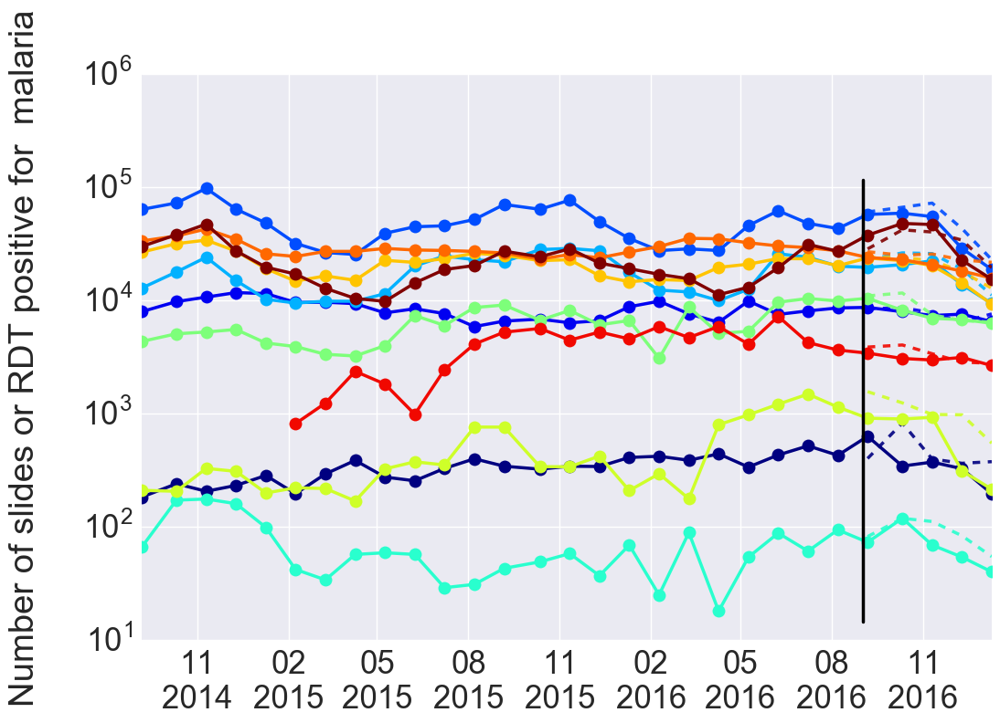

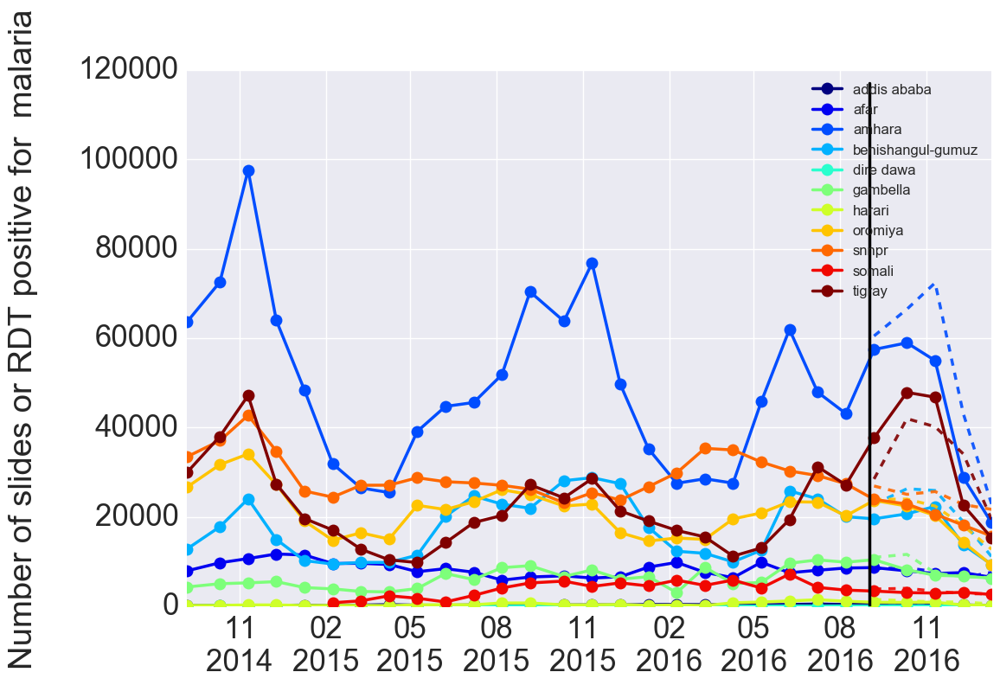

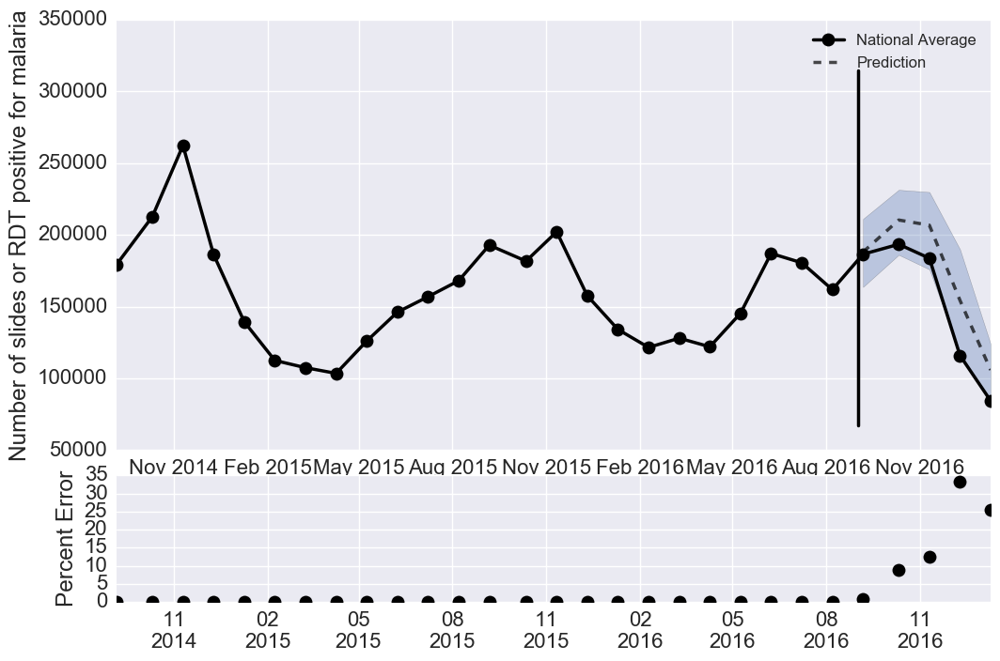

In [359]:
indicator = 'Number of slides or RDT positive for malaria'
series_plot = plot_date_indicator(DF_shift, indicator, val_name='val')
series_d = plot_date_indicator(DF_shift, indicator, val_name='prediction')

RMSE_zone = plot_testing(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2008, horz_line = (2016,9), logscale = True, show_leg=False)
RMSE_zone = plot_testing(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2008, horz_line = (2016,9), logscale = False)
to_plot, predict_plot, RMSE_n = plot_testing_nation(DF_shift, indicator, date_type='Real_Date', val_name='val', pred_name = 'prediction', train_year = 2008,  horz_line = (2016,9), cf_band=True)

# Forecast from the end of the training data. Does not include the predictions from DF_shift
ext_DF, forecast_DF = forecast(DF_training, RF, n_months=12)
# 1 year forcasting
RMSE_zone = plot_forcasting(DF_shift, ext_DF, indicator, val_name='val', train_year = 2008, logscale = True, show_leg=False)
to_plot, predict_plot, RMSE_n_for = plot_forcast_nation(DF_shift, ext_DF, indicator, val_name='val', train_year = 2008)


In [65]:
RMSE_n_for

0.24384330691978454

In [99]:
ext_DF.reset_index().groupby('Real_Date').count()

,E_Date,val,Indicator,gen_cat,age_cat,E_year,E_month,month,year,capital,...,log_density,log_prec_mm,log_prec_shift_1,log_prec_shift_2,log_prec_delta,prediction,diff,norm_diff,mse,Region
Real_Date,,,,,,,,,,,,,,,,,,,,,
2014-08-07,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
2014-09-11,69,69,69,69,69,69,69,69,69,69,...,69,69,69,69,69,69,69,69,69,69
2014-10-11,70,70,70,70,70,70,70,70,70,70,...,70,70,70,70,70,70,70,70,70,70
2014-11-10,70,70,70,70,70,70,70,70,70,70,...,70,70,70,70,70,70,70,70,70,70
2014-12-10,70,70,70,70,70,70,70,70,70,70,...,70,70,70,70,70,70,70,70,70,70
2015-01-09,70,70,70,70,70,70,70,70,70,70,...,70,70,70,70,70,70,70,70,70,70
2015-02-08,77,77,77,77,77,77,77,77,77,77,...,77,77,77,77,77,77,77,77,77,77
2015-03-10,77,77,77,77,77,77,77,77,77,77,...,77,77,77,77,77,77,77,77,77,77
2015-04-09,77,77,77,77,77,77,77,77,77,77,...,77,77,77,77,77,77,77,77,77,77


In [71]:
RMSE_n

0.050513294898222226

<h3> Average RMSE by zone </h3>

In [305]:
mean([val[1] for val in RMSE_zone])

0.39372372155003726

In [363]:
RMSE_zone

[(u'addis ababa', 0.4239058309228913),
 (u'afar', 0.22196805348941517),
 (u'amhara', 0.18514306811832315),
 (u'benishangul-gumuz', 0.38495702097887813),
 (u'dire dawa', 0.51745941509276139),
 (u'gambella', 0.40300024325087747),
 (u'harreri', 0.67906638558338417),
 (u'oromiya', 0.27511932944625578),
 (u'snnpr', 0.31642424292375732),
 (u'somali', 0.41412514213258272),
 (u'tigray', 0.19235698996560896)]

<h1> 2015 value in 2016 </h1>

In [323]:
DF_shift.loc[(DF_shift['Indicator']==ind) & (DF_shift['E_year']==2007)]

,Indicator_id,val,Region,Indicator,gen_cat,age_cat,E_Date,E_year,E_month,month,...,log_density,log_prec_mm,log_prec_shift_1,log_prec_shift_2,log_prec_delta,prediction,diff,norm_diff,mse,norm_rmse
Real_Date,,,,,,,,,,,,,,,,,,,,,
2014-09-11,hmis_indicator_4531,210.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-01-01,2007,1,9,...,2.739596,2.009451,2.145196,2.036230,0.010000,216.639642,0.9,0.004286,0.81,0.000018
2014-10-11,hmis_indicator_4531,205.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-02-01,2007,2,10,...,2.739596,1.704151,2.009451,2.145196,0.010000,202.073417,0.0,0.000000,0.00,0.000000
2014-11-10,hmis_indicator_4531,328.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-03-01,2007,3,11,...,2.739596,1.096910,1.704151,2.009451,0.010000,288.509561,48.3,0.147256,2332.89,0.021684
2014-12-10,hmis_indicator_4531,309.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-04-01,2007,4,12,...,2.739596,0.903090,1.096910,1.704151,0.010000,402.085968,5.2,0.016828,27.04,0.000283
2015-01-09,hmis_indicator_4531,199.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-05-01,2007,5,1,...,2.739596,1.294466,0.903090,1.096910,1.068186,242.010483,-25.0,-0.125628,625.00,0.015782
2015-02-08,hmis_indicator_4531,221.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-06-01,2007,6,2,...,2.739596,1.447158,1.294466,0.903090,0.919078,213.389441,-14.9,-0.067421,222.01,0.004546
2015-03-10,hmis_indicator_4531,218.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-07-01,2007,7,3,...,2.739596,1.773786,1.447158,1.294466,1.496930,238.497054,-9.8,-0.044954,96.04,0.002021
2015-04-09,hmis_indicator_4531,169.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-08-01,2007,8,4,...,2.739596,1.977266,1.773786,1.447158,1.550228,212.047758,-69.6,-0.411834,4844.16,0.169608
2015-05-09,hmis_indicator_4531,325.0,harreri,Number of slides or RDT positive for malaria,3,4,2007-09-01,2007,9,5,...,2.739596,2.009876,1.977266,1.773786,0.869232,298.729428,60.1,0.184923,3612.01,0.034197


In [318]:
DF_shift.val[(DF_shift['Indicator']==ind) & (DF_shift['E_year']==2007) & (DF_shift['E_month']==month)]

Real_Date
2014-11-10      328.0
2014-11-10    10580.0
2014-11-10    96716.0
2014-11-10      176.0
2014-11-10    24054.0
2014-11-10      206.0
2014-11-10    33157.0
2014-11-10    38622.0
2014-11-10    47187.0
2014-11-10     5261.0
Name: val, dtype: float64

In [333]:
overlap = [DF_shift.val[(DF_shift['Indicator']==ind) & (DF_shift['E_year']==2007) & (DF_shift['E_month']==month) \
               & (DF_shift['Region']==region)].values for ind,month,region \
                          in DF_shift[['Indicator','E_month','Region']].values]

In [335]:
overlap[0][0]

14.0

In [336]:
print sqrt(mean((DF_shift['val']-DF_shift['prediction'])**2))
sqrt(DF_shift.groupby('Region').mse.mean())/DF_shift.groupby('Region').mse.mean()*100

1739.6536962


Region
addis ababa          2.004740
afar                 0.171536
amhara               0.023499
benishangul-gumuz    0.056727
dire dawa            6.446471
gambella             0.132497
harreri              0.695542
oromiya              0.058907
snnpr                0.035912
somali               0.168206
tigray               0.049796
Name: mse, dtype: float64

<h1> Extrapolate 1 year </h1>

<h3> extrapolate one month at a time for each Region</h3>

In [101]:
DF_temp = DF_ind.reset_index().set_index(['Indicator_id','Region','E_Date']).sort_index(axis=0, level=[0,1,2])
DF_test = DF_temp.loc['hmis_indicator_4531'].loc['amhara']

In [115]:
DF_test

,Real_Date,val,Indicator,gen_cat,age_cat,E_year,E_month,month,year,capital,...,ave_temp,ave_prec_mm,elevation_m,infection_rate,is_capital,net_frac,temp,prec_mm,temp_cat,prec_cat
E_Date,,,,,,,,,,,,,,,,,,,,,
2006-11-01,2014-07-08,29417.0,Number of slides or RDT positive for malaria,3,4,2006,11,7,2014,Bahir Dar,...,17.0,1430.0,1800,0.001442,0,0.819843,17.0,434.0,0,3
2006-12-01,2014-08-07,40357.0,Number of slides or RDT positive for malaria,3,4,2006,12,8,2014,Bahir Dar,...,17.0,1430.0,1800,0.001978,0,0.819843,17.0,373.0,0,3
2007-01-01,2014-09-11,63575.0,Number of slides or RDT positive for malaria,3,4,2007,1,9,2014,Bahir Dar,...,17.0,1430.0,1800,0.003116,0,0.819843,17.0,204.0,0,3
2007-02-01,2014-10-11,72514.0,Number of slides or RDT positive for malaria,3,4,2007,2,10,2014,Bahir Dar,...,17.0,1430.0,1800,0.003554,0,0.819843,18.0,92.0,0,2
2007-03-01,2014-11-10,96716.0,Number of slides or RDT positive for malaria,3,4,2007,3,11,2014,Bahir Dar,...,17.0,1430.0,1800,0.004741,0,0.819843,17.0,22.0,0,1
2007-04-01,2014-12-10,63761.0,Number of slides or RDT positive for malaria,3,4,2007,4,12,2014,Bahir Dar,...,17.0,1430.0,1800,0.003125,0,0.819843,15.0,3.0,0,0
2007-05-01,2015-01-09,48209.0,Number of slides or RDT positive for malaria,3,4,2007,5,1,2015,Bahir Dar,...,17.0,1430.0,1800,0.002363,0,0.819843,15.0,3.0,0,0
2007-06-01,2015-02-08,31828.0,Number of slides or RDT positive for malaria,3,4,2007,6,2,2015,Bahir Dar,...,17.0,1430.0,1800,0.001560,0,0.819843,17.0,1.0,0,0
2007-07-01,2015-03-10,26443.0,Number of slides or RDT positive for malaria,3,4,2007,7,3,2015,Bahir Dar,...,17.0,1430.0,1800,0.001296,0,0.819843,20.0,8.0,1,0


In [46]:
# depends on DF_weather
DF_weather = pd.read_excel('/Users/attiladobi/Documents/Ethiopia_ave_weather.xlsx', header=1).dropna(how='all').set_index(['city','Field'])
month_map = {'JAN': 1, 'FEB': 2, 'MAR': 3, 'APR': 4, 'MAY': 5, 'JUN': 6, 'JUL': 7, 'AUG': 8, 'SEP': 9, 'OCT': 10, 'NOV': 11, 'DEC': 12 }
inv_month_map = {v: k for k, v in month_map.iteritems()}

def forecast(DF_test, RF, n_months=12):
    '''Pass in DF_shift to start from last month in the data or DF_training to start at last training month
    also specify the number of months to project (n_months = 12)
    Return the extended data frame'''
    
    # Initialize empty dataframe for projection
    ext_DF = pd.DataFrame()
    forecast_DF = pd.DataFrame()
    
    # set the index to Region and Ethiopian date and sort the date index
    DF_test = DF_test.reset_index().set_index(['Indicator_id', 'Region','E_Date']).sort_index(axis=0, level=[0, 1, 2])
    
    for indicator in DF_test.index.levels[0]:
        for region in DF_test.index.levels[1]:

            DF_temp = DF_test.loc[indicator].loc[region]
            
            is_first = True

            for xx in range(n_months+1):
                last_entry = DF_temp.tail(1).reset_index()
                
                if is_first:
                    start_date = last_entry['E_Date'][0]
                    is_first = False

                x = last_entry[features].values.reshape(1,-1)

                # predict new value and CF band:
                new_val = RF.predict(x)
                err_down, err_up = pred_ints(RF, x, percentile=90)
                
                last_entry['val'] = new_val
                last_entry['val_lower'] = err_down
                last_entry['val_upper'] = err_up
                # The predicted values also go in the prediction column
                # Which was the one month out forecast before the training date
                last_entry['prediction'] = new_val
                last_entry['prediction_lower'] = err_down
                last_entry['prediction_upper'] = err_up

                # increment date
                # add one month
                last_entry['E_Date'] = last_entry['E_Date'][0] + pd.offsets.relativedelta(months=1)
                last_entry.set_index('E_Date', inplace=True)

                # replace Real_Date with incremented E_Date
                last_entry['Real_Date'] = ethiopian_date.EthiopianDateConverter.date_to_gregorian(last_entry.index[0])

                last_entry.reset_index(inplace = True)

                last_entry['E_year'] = last_entry['E_Date'][0].year
                last_entry['E_month'] = last_entry['E_Date'][0].month
                last_entry['month'] = last_entry['Real_Date'][0].month
                last_entry['year'] = last_entry['Real_Date'][0].year

                #update current weather info

                last_entry['temp'] = [DF_weather.loc[capital,'temp'][inv_month_map[month]] for capital,month in zip(last_entry['capital'],last_entry['month'])]
                last_entry['prec_mm'] = [DF_weather.loc[capital,'prec_mm'][inv_month_map[month]] for capital,month in zip(last_entry['capital'],last_entry['month'])]
                last_entry['prec_mm'] = last_entry['prec_mm'].replace(nan,0)

                # The hard part... add the extrapolations 

                last_entry['val_shift_1'] = DF_temp.iloc[-1]['val']
                last_entry['temp_shift_1'] = DF_temp.iloc[-1]['temp']
                last_entry['prec_shift_1'] = DF_temp.iloc[-1]['prec_mm']
                #DF_ext['Region_shift_1'] = DF_temp.iloc[-1]['Region']
                #DF_ext['Ind_shift_1'] = DF_temp.iloc[-1]['Indicator']
                last_entry['temp_delta'] = last_entry['temp'] - DF_temp.iloc[-1]['temp_shift_1']
                last_entry['prec_delta'] = last_entry['prec_mm'] - DF_temp.iloc[-1]['prec_shift_1']

                last_entry['val_shift_2'] = DF_temp.iloc[-2]['val']
                last_entry['temp_shift_2'] = DF_temp.iloc[-2]['temp']
                last_entry['prec_shift_2'] = DF_temp.iloc[-2]['prec_mm']
                #last_entry['Region_shift_2'] = DF_ext.shift(2)['Region']
                #last_entry['Ind_shift_2'] = DF_ext.shift(2)['Indicator']
                last_entry['val_delta'] =  (last_entry['val_shift_1'] - last_entry['val_shift_2']) / last_entry['val_shift_2']

                # tack on to the end of the DF
                last_entry.set_index('E_Date', inplace = True)
                DF_temp = DF_temp.append(last_entry)

            # add back the region name   
            DF_temp['Indicator_id'] = indicator
            DF_temp['Region'] = region
            ext_DF = pd.concat([ext_DF, DF_temp])
            forecast_DF = pd.concat([forecast_DF, DF_temp[DF_temp.index > start_date] ]) #Index is E_Date

    ext_DF.reset_index(inplace = True)   
    ext_DF.set_index('Real_Date', inplace = True)
    forecast_DF.reset_index(inplace = True) 
    forecast_DF.set_index('Real_Date', inplace = True)
    
    return ext_DF, forecast_DF

<h1> Write to json or cvs </h1>

<h1> Canonical region information mapping </h1>

In [53]:
DF_region_map = pd.read_csv('/Users/attiladobi/zenysis/pipeline/auto/ethiopia/bin/shared/data/region_mapped.csv', \
                           float_precision='high', dtype={'RegionLat': np.float128, 'RegionLon': np.float128})
DF_region_map['RegionName_lower'] = [name.lower() for name in DF_region_map['RegionName']]
DF_region_map.set_index('RegionName_lower', inplace=True)
                                     

In [54]:
DF_region_map

,RegionName,RegionLat,RegionLon,match_0,match_1,match_2,match_3,match_4,match_5,match_6,match_7,match_8,match_9,match_10,match_11,match_12,match_13,match_14,match_15
RegionName_lower,,,,,,,,,,,,,,,,,,,
addis ababa,Addis Ababa,8.980483,38.785538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
afar,Afar,12.036445,40.772735,Affar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amhara,Amhara,11.564952,38.043536,amhara ( 03 ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
benishangul-gumuz,Benishangul-Gumuz,10.502924,35.440307,b/g,beneshangul,beneshangul gumu,beneshangul gumuz,beni shangul,benishangul,benishangul gumuz,benishangul gumz,benishangul-gumz,benishangule,benshangul,benshangul gumuz,benshangule gumuz,bgumuz,NaN,NaN
dire dawa,Dire Dawa,9.606269,42.003027,dere dawa,diredewa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gambella,Gambella,7.683850,34.336754,gamb.,gambela,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
harari,Harari,9.289660,42.172526,harar,hareri,harreri,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
oromiya,Oromiya,7.323567,38.660525,ormoia,oromia,oromya,oromyia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
snnpr,SNNPR,6.465809,36.806469,s.n.n.p.r,snnp,snnprs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
pd.options.display.float_format = '{:20,.5f}'.format
DF_region_map['RegionLat'].astype(np.float128)

RegionName_lower
addis ababa                      8.98048
afar                            12.03645
amhara                          11.56495
benishangul-gumuz               10.50292
dire dawa                        9.60627
gambella                         7.68385
harari                           9.28966
oromiya                          7.32357
snnpr                            6.46581
somali                           6.93278
tigray                          13.77711
Name: RegionLat, dtype: float128

In [56]:
lat_lon_map = { 'Addis Ababa': (8.980483001254077, 38.78553834507309), 
'Afar': (12.036445063176075, 40.772735414805204),
'Amhara': (11.5649524790046, 38.04353615460529),
'Benishangul-Gumuz': (10.502924415157686, 35.44030701966273),
'Dire Dawa': (9.606269193503696, 42.003026894902156),
'Gambella':(7.683850454124325, 34.33675414861345),
'Harari': (9.289660023774802, 42.172525872858124),
'Oromiya': (7.323567398452454, 38.66052453790127),
'Somali': (6.932778405509416, 43.32988331430246),
'SNNPR': (6.465808724769859, 36.806469462905675),
'Tigray': (13.777114742142253, 38.43867332133363 ),  
}    
    

<h1> format the data into json for injestion </h1>

In [ ]:
ext_DF

In [57]:
# only forecast_DF
# onlt ext
Formatted_DF = ext_DF[['val', 'prediction',  'Region', 'Indicator_id']].rename(columns = \
                                {'Indicator_id': 'field', 'Region': 'RegionName'})
#Harreri update
#Formatted_DF.loc[Formatted_DF['RegionName'] == 'harreri']['RegionName'] = 'harari'

Formatted_DF['RegionName'] = [region if region != 'harreri' else 'harari' for region in Formatted_DF['RegionName']]

Formatted_DF['field'] = ['forecast_%s' % (field) for field in Formatted_DF['field']]
Formatted_DF.index = pd.DatetimeIndex(Formatted_DF.index)


# Overwrite the lowercased region name with the canonical value
Formatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]

Formatted_DF['source'] ='forecast'
Formatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]

'''
Formatted_DF['RegionLat'] = [DF_region_map.loc[region]['RegionLat'] for region in Formatted_DF['RegionName']]
Formatted_DF['RegionLon'] = [DF_region_map.loc[region]['RegionLon'] for region in Formatted_DF['RegionName']]
#finally overwrite the lowercased region name with the canonical value
Formatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]

Formatted_DF['source'] ='forecast'
Formatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]

Formatted_DF['RegionLat'] = [lat_lon_map[region][0] for region in Formatted_DF['RegionName']]
Formatted_DF['RegionLon'] = [lat_lon_map[region][1] for region in Formatted_DF['RegionName']]
'''

"\nFormatted_DF['RegionLat'] = [DF_region_map.loc[region]['RegionLat'] for region in Formatted_DF['RegionName']]\nFormatted_DF['RegionLon'] = [DF_region_map.loc[region]['RegionLon'] for region in Formatted_DF['RegionName']]\n#finally overwrite the lowercased region name with the canonical value\nFormatted_DF['RegionName'] = [DF_region_map.loc[region]['RegionName'] for region in Formatted_DF['RegionName']]\n\nFormatted_DF['source'] ='forecast'\nFormatted_DF['Real_Date'] = [date.strftime('%Y-%m-%d') for date in Formatted_DF.index]\n\nFormatted_DF['RegionLat'] = [lat_lon_map[region][0] for region in Formatted_DF['RegionName']]\nFormatted_DF['RegionLon'] = [lat_lon_map[region][1] for region in Formatted_DF['RegionName']]\n"

In [2594]:
#Formatted_DF['val'] = Formatted_DF['val'].map(lambda x: float(x))

Formatted_DF.to_csv('Malaria_Forecast_2009.csv')
Formatted_DF.to_json('Malaria_Forecast_2009.json', orient='records', double_precision=15)


In [89]:
Formatted_DF

,val,RegionName,field,source,Real_Date
Real_Date,,,,,
2014-09-06,183.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-09-06
2014-10-11,240.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-10-11
2014-11-10,206.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-11-10
2014-12-10,232.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2014-12-10
2015-01-09,284.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-01-09
2015-02-08,196.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-02-08
2015-03-10,293.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-03-10
2015-04-09,386.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-04-09
2015-05-09,275.00000,Addis Ababa,forecast_composite_indicator_47,forecast,2015-05-09


<h1> Write to json </h1>

In [59]:
#write to json
from collections import OrderedDict
with open("forecast.json", "w") as outfile:
    for line in Formatted_DF.iterrows():
        line = line[1]
        region = line['RegionName']
        json.dump(OrderedDict([('Real_Date', line['Real_Date']), ('RegionName', region), \
                   ('val', line['prediction']), ('field', line['field']), \
                   ('source', 'forecast'), ('RegionLat', lat_lon_map[region][0]), \
                   ('RegionLon', lat_lon_map[region][1])]), outfile)
        outfile.write('\n')

<h1> save to csv file </h1>

In [ ]:
with open('forecast.json', 'wb') as f:
        # Assuming that all dictionaries in the list have the same keys.
        headers = ['Real_Date', 'RegionName', 'val', 'val_lower', 'val_upper', 'field', 'source', 'RegionLat', 'RegionLon']
        csv_data = [headers]

        for line in Formatted_DF.iterrows():
            line = line[1]
            region = line['RegionName']
            data = [line['Real_Date'], \
                    region, \
                    line['val'], line['val_lower'], line['val_upper'],\
                    line['field'], \
                    'forecast', \
                    lat_lon_map[region][0], \
                    lat_lon_map[region][1]]
            csv_data.append(data)

        writer = csv.writer(f)
        writer.writerows(csv_data)

<h1> update values for new month and new prediction </h1>

In [1432]:
DF_temp = DF_temp.append(last_entry)

In [1461]:
add_one_month(DF_temp.tail(1).index[0])

datetime.datetime(2009, 3, 1, 0, 0)

In [1528]:
#DF_temp.tail(1).index = add_one_month(DF_temp.tail(1).index[0])

In [ ]:
DF_temp.tail(1)

In [139]:
pd.compat?

In [1343]:
series_d.index.levels[0]

Index([u'addis ababa', u'afar', u'amhara', u'benishangul-gumuz', u'dire dawa',
       u'gambella', u'harreri', u'oromiya', u'snnpr', u'somali', u'tigray'],
      dtype='object', name=u'Region')

<h1> Extrapolate for 1 year </h1>

In [1347]:
ext_range = pd.date_range('1/1/2009', periods=12, freq='M')
ext_dates = [set_to_first_of_month(date) for date in ext_range]

In [1378]:
DF_ext = pd.DataFrame(ext_dates, columns = ['E_Date'])

In [1379]:
DF_ext['Real_Date'] = [ethiopian_date.EthiopianDateConverter.date_to_gregorian(date) for date in DF_ext['E_Date']]
#DF_ext['Real_Date'] = [pd.datetime(date) for date in DF_ext['Real_Date']]

In [1380]:
region = series_d.index.levels[0][0]
DF_ext['Region'] = region

In [1381]:
DF_ext

,E_Date,Real_Date,Region
0,2009-01-01,2016-09-11,addis ababa
1,2009-02-01,2016-10-11,addis ababa
2,2009-03-01,2016-11-10,addis ababa
3,2009-04-01,2016-12-10,addis ababa
4,2009-05-01,2017-01-09,addis ababa
5,2009-06-01,2017-02-08,addis ababa
6,2009-07-01,2017-03-10,addis ababa
7,2009-08-01,2017-04-09,addis ababa
8,2009-09-01,2017-05-09,addis ababa
9,2009-10-01,2017-06-08,addis ababa


In [1382]:
DF_ext['E_Date']

0     2009-01-01
1     2009-02-01
2     2009-03-01
3     2009-04-01
4     2009-05-01
5     2009-06-01
6     2009-07-01
7     2009-08-01
8     2009-09-01
9     2009-10-01
10    2009-11-01
11    2009-12-01
Name: E_Date, dtype: object

In [1383]:
#DF_ext['E_Date'] = DF_ext['E_Date'].astype(datetime64)
DF_ext.set_index('Real_Date', inplace=True)
DF_ext.index = DF_ext.index.astype(datetime64)
DF_ext['E_year'] = [val.year for val in DF_ext['E_Date']]
DF_ext['E_month'] = [val.month for val in DF_ext['E_Date']]
DF_ext['month'] = DF_ext.index.month
DF_ext['year'] = DF_ext.index.year

<h3> set indicator name </h3>

In [1385]:
DF_ext['Indicator'] = indicator

In [1386]:
DF_ext

,E_Date,Region,E_year,E_month,month,year,Indicator
Real_Date,,,,,,,
2016-09-11,2009-01-01,addis ababa,2009,1,9,2016,Number of slides or RDT positive for malaria
2016-10-11,2009-02-01,addis ababa,2009,2,10,2016,Number of slides or RDT positive for malaria
2016-11-10,2009-03-01,addis ababa,2009,3,11,2016,Number of slides or RDT positive for malaria
2016-12-10,2009-04-01,addis ababa,2009,4,12,2016,Number of slides or RDT positive for malaria
2017-01-09,2009-05-01,addis ababa,2009,5,1,2017,Number of slides or RDT positive for malaria
2017-02-08,2009-06-01,addis ababa,2009,6,2,2017,Number of slides or RDT positive for malaria
2017-03-10,2009-07-01,addis ababa,2009,7,3,2017,Number of slides or RDT positive for malaria
2017-04-09,2009-08-01,addis ababa,2009,8,4,2017,Number of slides or RDT positive for malaria
2017-05-09,2009-09-01,addis ababa,2009,9,5,2017,Number of slides or RDT positive for malaria


<h3> add weather and regional attributes to the data </h3>

In [1390]:
DF_ext['capital'] = [DF_pop.loc[key]['Capital'] for key in DF_ext['Region']]
DF_ext['pop'] = [DF_pop['Population'][key] for key in DF_ext['Region']]
DF_ext['density'] = [DF_pop['Density'][key] for key in DF_ext['Region']]
DF_ext['ave_temp'] = [DF_pop['ave_temp'][key] for key in DF_ext['Region']]
DF_ext['ave_prec_mm'] = [DF_pop['ave_prec_mm'][key] for key in DF_ext['Region']]
DF_ext['elevation_m'] = [DF_pop['Elevation_m'][key] for key in DF_ext['Region']]
#DF_ext['infection_rate'] = DF_ext['val'] / DF_ext['pop'] #only applies to one indicator: indicator = 'Number of slides or RDT positive for malaria'

DF_ext['net_frac'] = [DF_mean_nets.val[region] for region in DF_ext['Region']]

DF_ext['temp'] = [DF_weather.loc[capital,'temp'][inv_month_map[month]] for capital,month in zip(DF_ext['capital'],DF_ext['month'])]
DF_ext['prec_mm'] = [DF_weather.loc[capital,'prec_mm'][inv_month_map[month]] for capital,month in zip(DF_ext['capital'],DF_ext['month'])]
DF_ext['prec_mm'] = DF_ext['prec_mm'].replace(nan,0)

DF_ext['temp_cat'] = [temp_map(temp) for temp in DF_ext['temp']]
DF_ext['prec_cat'] = [prec_map(prec) for prec in DF_ext['prec_mm']]

DF_ext['val_shift_1'] = DF_ext.shift(1)['val']
DF_ext['temp_shift_1'] = DF_ext.shift(1)['temp']
DF_ext['temp_cat_shift_1'] = DF_ext.shift(1)['temp_cat']
DF_ext['prec_shift_1'] = DF_ext.shift(1)['prec_mm']
DF_ext['prec_cat_shift_1'] = DF_ext.shift(1)['prec_cat']
DF_ext['Region_shift_1'] = DF_ext.shift(1)['Region']
DF_ext['Ind_shift_1'] = DF_ext.shift(1)['Indicator']
DF_ext['temp_delta'] = DF_ext['temp'] - DF_shift['temp_shift_1']
DF_ext['prec_delta'] = DF_ext['prec_mm'] - DF_shift['prec_shift_1']

DF_ext['val_shift_2'] = DF_ext.shift(2)['val']
DF_ext['temp_shift_2'] = DF_ext.shift(2)['temp']
DF_ext['temp_cat_shift_2'] = DF_ext.shift(2)['temp_cat']
DF_ext['prec_shift_2'] = DF_ext.shift(2)['prec_mm']
DF_ext['prec_cat_shift_2'] = DF_ext.shift(2)['prec_cat']
DF_ext['Region_shift_2'] = DF_ext.shift(2)['Region']
DF_ext['Ind_shift_2'] = DF_ext.shift(2)['Indicator']

DF_ext = DF_ext.loc[(DF_ext['Region'] == DF_ext['Region_shift_1']) &\
                      (DF_ext['Indicator'] == DF_ext['Ind_shift_1']) &\
                      (DF_ext['Region'] == DF_ext['Region_shift_2']) &\
                      (DF_ext['Indicator'] == DF_ext['Ind_shift_2']) ]

In [1391]:
DF_ext

,E_Date,Region,E_year,E_month,month,year,Indicator,capital,pop,density,ave_temp,ave_prec_mm,elevation_m,net_frac,temp,prec_mm,temp_cat,prec_cat
Real_Date,,,,,,,,,,,,,,,,,,
2016-09-11,2009-01-01,addis ababa,2009,1,9,2016,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,16.0,180.0,0,3
2016-10-11,2009-02-01,addis ababa,2009,2,10,2016,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,16.0,20.0,0,1
2016-11-10,2009-03-01,addis ababa,2009,3,11,2016,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,15.0,10.0,0,0
2016-12-10,2009-04-01,addis ababa,2009,4,12,2016,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,15.0,10.0,0,0
2017-01-09,2009-05-01,addis ababa,2009,5,1,2017,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,16.0,10.0,0,0
2017-02-08,2009-06-01,addis ababa,2009,6,2,2017,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,17.0,30.0,0,1
2017-03-10,2009-07-01,addis ababa,2009,7,3,2017,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,17.0,60.0,0,2
2017-04-09,2009-08-01,addis ababa,2009,8,4,2017,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,17.0,80.0,0,2
2017-05-09,2009-09-01,addis ababa,2009,9,5,2017,Number of slides or RDT positive for malaria,Addis Ababa,3273000,5198.49,16.0,1210.0,2355,0.822821,18.0,80.0,0,2


In [109]:
DF_ind.groupby('Indicator').first().index

Index([u'Number of slides or RDT positive for malaria',
       u'Number of slides or RDT positive for malaria 5-14 years: Females',
       u'Number of slides or RDT positive for malaria 5-14 years: Males',
       u'Number of slides or RDT positive for malaria < 5 years: Females',
       u'Number of slides or RDT positive for malaria < 5 years: Males',
       u'Number of slides or RDT positive for malaria >=15 years: Females',
       u'Number of slides or RDT positive for malaria >=15 years: Males',
       u'Proportion of targeted HH covered with LLIN in the last 12 months',
       u'Total number of slides or RDT performed for malaria diagnosis'],
      dtype='object', name=u'Indicator')

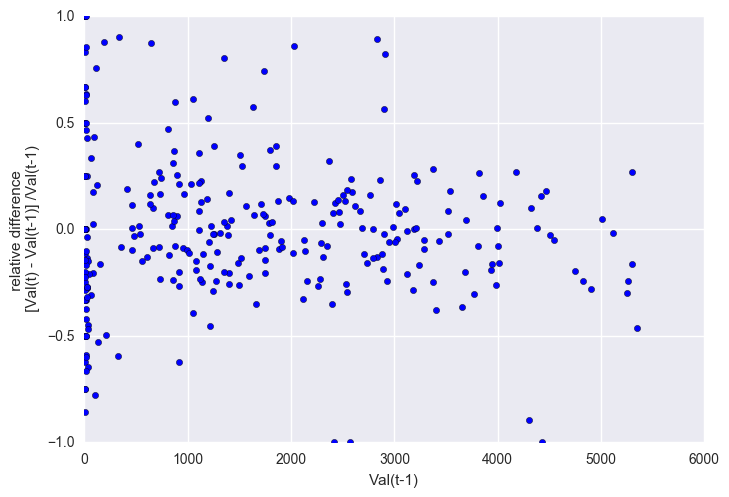

In [138]:
cur_val = DF_ind[DF_ind['Indicator'].str.contains('Number of slides or RDT positive for malaria 5-14 years: Females')]\
.val.drop(0).values[1:]

prev_val = DF_ind[DF_ind['Indicator'].str.contains('Number of slides or RDT positive for malaria 5-14 years: Females')]\
.val.drop(0).shift().values[1:]

plt.scatter(prev_val, (cur_val-prev_val)/prev_val)
#xscale('log')
#yscale('log')
ylim([-1,1])
xlim([-1,6000])
xlabel('Val(t-1)')
ylabel(' relative difference \n [Val(t) - Val(t-1)] /Val(t-1)' )

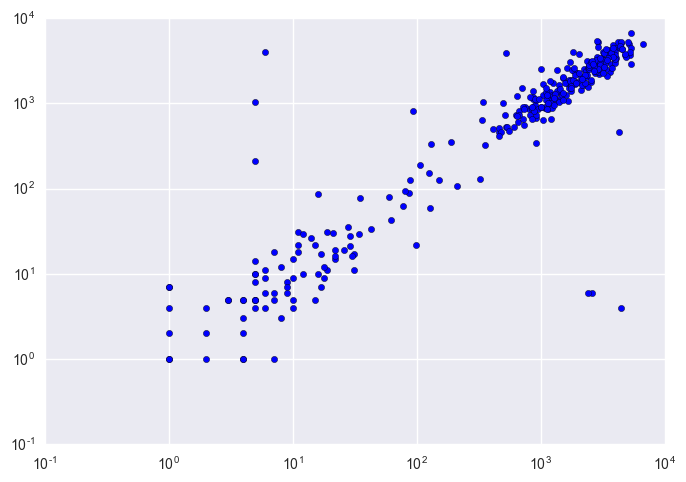